# 1 Imports and Helper Functions

__Global Variables__

- `abc` contains the letters of the abc as a list
- `sections` contains the names of the five sub-sections of each log
- `xyz` is a shortcut for `list("xyz")`
- `angles` contains the names of angles (alpha, beta, ...)


In [2]:
import os
import pandas as pd
from matplotlib import colors as mplcolors
import matplotlib.pyplot as plt
import numpy as np
from mpl_toolkits import mplot3d
from FillBetween3d import fill_between_3d
from typing import Literal
import re
import datetime as dt
import itertools as it
from decimal import Decimal as D
import pathlib as pl
import quaternion as qtn
from scipy.spatial.transform import Rotation

In [3]:
pd.set_option("display.max_columns", 100)
pd.set_option("display.max_rows", 100)
pd.set_option("display.min_rows", 100)
pd.set_option('display.float_format', str)

## 1.1 Constants

In [4]:
# GENERAL

abc = list("abcdefghijklmnopqrstuvwxyz")
sections = ["left_hand", "right_hand", "left_sword", "right_sword", "head"]
xyz = list("xyz")
angles = [
    "alpha", "beta", "gamma",
    "delta", "epsilon", "zeta",
    "eta", "theta", "iota",
    "kappa", "lambda", "mu",
    "nu", "xi", "omicron",
    "pi", "rho", "sigma",
    "tau", "upsilon", "phi",
    "chi", "psi", "omega"]


# VISUALIZATION

default_colors = {
    "left_hand":   ["yellow", "#D5D500"],
    "right_hand":  ["deepskyblue", "dodgerblue"],
    "left_sword":  ["red", "#AA0000"],
    "right_sword": ["blue", "darkblue"],
    "head":        ["green", "darkgreen"],
    "left_fill":   ["orange", "#AA6E00"],
    "right_fill":  ["dodgerblue", "blue"]}

matching = {
    "lh": "left_hand",
    "rh": "right_hand",
    "ls": "left_sword",
    "rs": "right_sword",
    "lsv": "left",  # left sword vector
    "rsv": "right",  # right sword vector
    "h": "head",
    "hand": "hand",
    "s": "sword"}

# ANGLE_SPACING = 10
movement_types = {
    "vertical_up": [350, 10],
    "diagonal_bottom_right": [10, 80],
    "horizontal_right": [80, 100],
    "diagonal_top_right": [100, 170],
    "vertical_down": [170, 190],
    "diagonal_top_left": [190, 260],
    "horizontal_left": [260, 280],
    "diagonal_bottom_left": [280, 350]
}

In [5]:
TIME_BETWEEN = 0.02  # D("0.02")
POINTS_BETWEEN = 10
SPEED_THRESHOLD = 0.01

## 1.2 Helper Functions

### 1.2.1 `check_lengths()`

In [6]:
def check_lengths(nested_list: list[list]):
    k = len(nested_list[0])  # get the length of the first point-list
    length_check = [len(n) != k for n in nested_list]
    if any(length_check):
        error_msg = "Nested lists must all be of the same length!\n"
        issues = [i for i, l in enumerate(length_check) if l]
        for issue in issues:
            error_msg += f"len({nested_list[0]}) at [0] != len({nested_list[issue]}) at [{issue}]\n"
        return False, error_msg
    else:
        return True, ""

### 1.2.2 Convert between Columns and Lists of Points

The function `points_to_columns()` takes a list of lists of format 

```python
[[x1, y1, z1],
 [x2, y2, z2],
 [x3, y3, z3],
 [x4, y4, z4],
 ...]
```

with len() == k and k >= 2 for each nested list (k = 3 in this example) and returns a list of format

```python
[[x1, x2, x3, x4, ...],
 [y1, y2, y3, y4, ...],
 [z1, z2, z3, z4, ...]]

-> k lists of len(input_list)
```


`columns_to_points()` is the inverse, however it takes a dataframe and the names of the columns to use as input:

In [7]:
def points_to_columns(points_list: list[list]):

    """
    takes a list of format [[x1, y1, z1], [x2, y2, z2], ...] and
    returns a list of format [[x1, x2, ...], [y1, y2, ...], [z1, z2, ...]]

    The points can have any number of values from two up (doesn't have to be three)
    """

    check, msg = check_lengths(points_list)
    if not check:
        raise ValueError(msg)

    # `*points_list` unpacks the nested lists into separate arguments for zip
    # zip(...) then zips them together into n lists
    # list(z) converts the resulting immutable tuples into mutable lists

    return [list(z) for z in zip(*points_list)]  # list(zip(*points_list))

In [8]:
def columns_to_points(input: pd.DataFrame | list, columns: list[str] | str = []):
    """
    the inverse of points_to_columns()
    If a dataframe is provided as the inputbut using a dataframe's column names for the input
    """

    if isinstance(input, pd.DataFrame):
        if len(columns) < 1:
            columns = input.columns.to_list()
        # if isinstance(columns, str):
        # get the columns' values as a list of value lists
        vals = [input[c].to_list() for c in columns]
    else:
        check, msg = check_lengths(input)
        if not check:
            raise ValueError(msg)
        vals = input
    return [list(z) for z in zip(*vals)]

### 1.2.3 Convert between different String Formats

- Camel Case: textInThisFormat
- Snake Case: text_in_this_format
- Text: Text In This Format

The three functions `to_snake_case()`, `to_camel_case()`, and `to_text()` are capable of converting a string in the other two formats to this one.

`text_to_list(string, sep)` takes a string and turns it into a list of strings (filtering out whitespaces and such)

In [9]:
def to_snake_case(string: str):
    if " " in string:  # if text
        return string.replace(" ", "_").lower()
    
    # if camelCase
    res = ""
    for char in string:
        res += char if char.islower() else char if res[-1].isdigit() else "_" + char.lower()
        #  the isdigit() clause ensures that numbers (multiple digits) are kept together instead of separated by "_"
    return res

In [10]:
def to_camel_case(string: str):
    split_char = " " if " " in string else "_"

    res = string.split(split_char)[0]
    for word in string.split(split_char)[1:]:
        res += word.capitalize()
    return res

In [11]:
def to_text(string: str):
    case = "snake" if "_" in string else "camel"
    if case == "snake":
        words = string.split("_")
        return " ".join([w.capitalize() for w in words])
    
    if case == "camel":
        res = ""
        for char in string:
            res += char if char.islower() else char if res[-1].isdigit() else " " + char.lower()
        return " ".join([w.capitalize() for w in res.split()])

In [1]:
def text_to_list(string: str, sep: str = ","):
    return string.replace(" ", "").split(sep)

In [13]:
def to_time(iso_time: str):
    datetime_ts = dt.datetime.fromisoformat(iso_time[:-2])  # strip off UTC 0 (00Z)
    return round(dt.datetime.timestamp(datetime_ts), 6)

### 1.2.4 Get all Files from a Directory (and its Subdirectories)

In [14]:
def get_all_files(
        directory: str,
        extensions: str | list[str] = "",
        full_path: bool = False):
    
    if isinstance(extensions, str):
        extensions = [extensions]

    files = list()

    for ext in extensions:
        if full_path:
            files.extend([p.as_posix() for p in pl.Path(directory).rglob(f"*{ext}")])
        else:
            files.extend([p.name for p in pl.Path(directory).rglob(f"*{ext}")])
    
    return files

In [15]:
def get_files_dict(directory: str, extensions: str):
    file_names = get_all_files(
        directory=directory, extensions=extensions, full_path=False)
    file_paths = get_all_files(
        directory=directory, extensions=extensions, full_path=True)

    return {k: v for k, v in zip(file_names, file_paths)}

## 1.3 Further Helper Functions

`get_differences(value_list: list)` returns the differences between the values of a list, pretending the last value equals the second to last.

```python
[a, b, c, d, e, ...] -> [abs(b - a), abs(c - b), abs(d - c), ...]
```


`to_rounded_decimal` works best with a str input but accepts numeric inputs too. It converts the provided value to Decimal and rounds to precision 2.

### `get_differences()`

In [16]:
def get_differences(value_list: list, points_between: int = 1, keep_signs: bool = False):
    if keep_signs:
        res = [round(x[1] - x[0], 2) for x in zip(
            value_list[:-points_between], value_list[points_between:])]
    else:
        res = [round(abs(x[1] - x[0]), 2) for x in zip(
            value_list[:-points_between], value_list[points_between:])]
    return res + [res[-1]] * points_between

### `get_vector_length()`

works on vectors of any dimension (not restricted to 3D)

In [17]:
def get_vector_length(vector: list | tuple, round_to: int = -1) -> int | float:
    length = np.sqrt(sum([k**2 for k in vector]))
    if np.isnan(length):
        return 0
    elif round_to == -1:
        return length
    elif round_to == 0:
        return int(round(length, 0))
    else:
        return round(length, round_to)

### `get_distances()`

While `get_vector_length()` finds the "distance" between the vector end point and the origin; `get_distances()` takes a list of points and calculates the distances between each point and the next.
The points can be in any dimension ([x] or [x, y] or [x, y, z], ...) as long as all of the points are of the same length.

In [18]:
def get_distances(points_list: list[list], round_to: int = -1):
    """
    [a, b, c, d, ... ] 
    -> [dist(a|b), dist(b|c), dist(c|d), ...] + [distances[-1]]
    """
    points_list = [np.array(point) for point in points_list]
    dist = list()
    for i in range(0, len(points_list) - 1):
        d = np.linalg.norm(points_list[i+1] - points_list[i])
        dist.append(d) if not np.isnan(d) else dist.append(0)
    dist = dist + [dist[-1]]
    return dist if round_to == -1 else [round(d, round_to) for d in dist]

### `get_angle_between_vectors()`

In [19]:
def get_angle_between_vectors(vector_a: list, vector_b: list, round_to: int = 4):
    check, msg = check_lengths([vector_a, vector_b])
    if not check:
        raise ValueError(f"Vectors are of different lengths! "
                         f"{len(vector_a)} != {len(vector_b)}")

    magnitude_a = np.sqrt(sum([k**2 for k in vector_a]))
    magnitude_b = np.sqrt(sum([k**2 for k in vector_b]))
    vector_product = sum([vector_a[i] * vector_b[i] for i in range(len(vector_a))])
    if any([np.isnan(magnitude_a), np.isnan(magnitude_b), np.isnan(vector_product),
            magnitude_a == 0, magnitude_b == 0, vector_product == 0]):
        return 0
    res = np.rad2deg(
        np.arccos(vector_product / (magnitude_a * magnitude_b)))
    return round(res / 45) * 45 if round_to == 45 else round(res, round_to) if round_to >= 0 else res

### `get_vector_from_angle()`

In [20]:
def get_vector_from_angle(
        angle: float,
        axis: Literal["x", "y", "z"],
        round_to: int = 4,
        angle_in_degrees: bool = True):
    axes = xyz.copy()
    axes.remove(axis)
    angle = angle * np.pi / 180. if angle_in_degrees else angle
    res = [0.] * 3
    res[xyz.index(axes[0])] = round(np.cos(angle), round_to)
    res[xyz.index(axes[1])] = round(np.sin(angle), round_to)
    return res

### `get_columns()`

In [21]:
def get_columns(df: pd.DataFrame, columns: str | Literal["ypr"], returns: Literal["dataframe", "names"] = "dataframe"):
    if columns == "ypr":
        cols = [c for c in df.columns.to_list() if any(["yaw" in c, "pitch" in c, "roll" in c])]
    else:
        cols = [c for c in df.columns.to_list() if columns in c]
    return df[cols] if returns == "dataframe" else cols

### `get_units()`

In [ ]:
def get_units(df: pd.DataFrame):

    units = dict()

    for col in df.columns.to_list():
        if "timestamp" in col:
            units[col] = ""
        elif any(["euler" in col, "yaw" in col, "pitch" in col, "roll" in col]):
            units[col] = "degrees"
        elif "_q_" in col:
            units[col] = ""
        elif "speed" in col:
            units[col] = "m/s"
        else:
            units[col] = "meters"

    return units

### `show_statistics()`

In [22]:
def show_statistics(df, columns: str = ""):

    units = get_units(df=df)

    if len(columns) > 0:
        cols = [c for c in df.columns.to_list() if columns in c]
    else:
        cols = df.columns.to_list()

    if len(cols) > 1:
        print(f"Object with {df.shape[0]} rows and {df.shape[1]} columns")

    for col in cols:
        minimum = df[col].min()
        maximum = df[col].max()
        if len(units[col]) > 0:
            print(f"{col} Range [{minimum} : {maximum}]", 
                f"-> Diff {abs(maximum - minimum):.2f} {units[col]}")
        else:
            print(f"{col} Range [{minimum} : {maximum}]")

### `print_red()`

In [ ]:
def print_red(text: str):
    print(f"\033[91m {text}\033[00m")

### Modify dict_keys

In [24]:
def modify_dict_keys(
        dictionary,
        remove_string: str = "",
        add_string: str = "",
        add_as: Literal["suffix", "prefix", "before_last"] = "prefix"):
    """
    remove_string is called before add_string when both are set
    """

    key_list, value_list = points_to_columns(list(dictionary.items()))

    if len(remove_string):
        adj_key_list = key_list = [
            "_".join(
                [i for i in k.split("_") if i != remove_string]
            ) for k in key_list]

    if len(add_string):
        add_string = add_string.removeprefix("_").removesuffix("_")

        if add_as == "prefix":
            adj_key_list = [f"{add_string}_{k}" for k in key_list]
        elif add_as == "suffix":
            adj_key_list = [f"{k}_{add_string}" for k in key_list]
        else:
            last = [k.split("_")[-1] for k in key_list]
            before_and_last = [[k[:-len(l)-1], l] for k, l in zip(key_list, last)]
            adj_key_list = [f"{b}_{add_string}_{l}" for [b, l] in before_and_last]
            # doing s[:-1], s[-1] for s in k.split("_") fails when len(key) == 2
            # (s[0:-1] = s[0:0], so the first part is lost)
            # hence the above method for before_and_last is used
    
    adj_key_list = [k.removeprefix("_").removesuffix("_") for k in adj_key_list]
    modified = {k: v for k, v in zip(adj_key_list, value_list)}
    return modified

# 2 Log

## 2.1 Additional Column Functions

These functions calculate additional columns based on the preexisting ones. All of these functions share many of their parameters:

- `df`: the log DataFrame
- `results`: `Literal["insert", "dict", "create"]`
  - `"insert"` adds the columns into the dataframe,
  - `"dict"` outputs the results as a dictionary, and
  - `"create"` outputs the results as a separate, new dataframe.
- `sections_to_use`: list of "sections" (i.e., section_x, section_y, section_z) to run the calculations on
  - the exact sections vary between each function
- `points_between`: for any functions with spaced calculations, this determines how _much_ space (how many points between) to leave
  - defaults to `POINTS_BETWEEN` for most functions
- `round_to`: all the functions round the result, this parameter lets you adjust the digits
- `do_prints`: a boolean which simply determines whether or not any prints should actually be outputted or not
  - useful for debugging, otherwise usually set to False

### `get_sword_vectors()`

returns normalized vector of left/right sword (from origin, of original length)

In [25]:
def get_sword_vectors(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        sections_to_use: list = ["left", "right"],
        points_between: int = POINTS_BETWEEN,
        round_to: int = 3,
        do_prints: bool = True):

    results_dict = dict()

    # if do_prints:
    #     print((f"points_between: {points_between} -> "
    #         f"time between: {points_between * TIME_BETWEEN:.2f} seconds"))

    for s in sections_to_use:

        # if f"{s}_x" in df.columns.to_list() and results == "insert":
        #     if do_prints:
        #         print("DataFrame already has sword columns")
        #     continue

        vector_list = list()

        for i in range(3):  # for k in "xyz"
            vals1, vals2 = df[f"{s}_hand_{xyz[i]}"].to_list(), df[f"{s}_sword_{xyz[i]}"].to_list()
            vector_list.append([round(x[1] - x[0], round_to) for x in zip(vals1, vals2)])

            colname = f"{s}_{xyz[i]}"
            results_dict[colname] = vector_list[i]

            if results == "insert":
                if colname in df.columns.to_list():
                    df[colname] = vector_list[i]
                else:
                    ind = df.columns.to_list().index(f"{s}_hand_euler_z") + 1
                    df.insert(ind + i, colname, vector_list[i])

    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df

### `get_speeds()`

In [26]:
def get_speeds(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        sections_to_use: list = ["left_hand", "right_hand", "left_sword", "right_sword"],
        points_between: int = POINTS_BETWEEN,
        round_to: int = 4,
        do_prints: bool = False):

    """
    calculates the speed as (points[i + 1] - points[i]) / (time[i + 1] - time[i])
    any [..., 0, 0, 0.5, 0, ...] are turned into [..., 0, 0, 0, 0, ...], and likewise,
    [..., 0.05, 0, 0.03, 0.03, ...] are turned into [..., 0.05, 0.04, 0.03, 0.03, ...]
    for smoothed, speed is re-calculated as the average of speed[i:i+points_between]
    """

    results_dict = dict()

    for s in sections_to_use:

        # if f"{s}_speed" in df.columns.to_list() and results == "insert":
        #     if do_prints:
        #         print("DataFrame already has speed columns")
        #     continue

        distances = get_distances(
            columns_to_points(df, [f"{s}_{k}" for k in xyz]))
        
        times = get_differences(
            df.adjusted_timestamp.to_list(),
            points_between=1)
        
        speed = [dt[0] / dt[1] for dt in zip(distances, times)]

        for i in range(1, len(speed) - 1):
            if not (speed[i-1] or speed[i+1]):
                speed[i] = 0
            if speed[i-1] and speed[i+1] and not speed[i]:
                speed[i] = (speed[i-1] + speed[i+1]) / 2

        smoothed = [round(sum(
            speed[i:i+points_between]) / points_between,
            round_to) for i in range(
                len(speed) - points_between)]
        smoothed += [smoothed[-1]] * points_between

        speed = [round(s, round_to) for s in speed]
        smoothed = [round(s, round_to) for s in smoothed]

        if do_prints:
            zeros = speed.count(0)
            perc = zeros * 100. / len(speed)
            print(f"{s}: {zeros} points with speed of 0 m/s ({perc:.2f}%)")
    
            zeros = smoothed.count(0)
            perc = zeros * 100. / len(smoothed)
            print(f"{s}: {zeros} points with smoothed speed of 0 m/s ({perc:.2f}%)")

        results_dict[f"{s}_speed"] = speed
        results_dict[f"{s}_speed_smoothed"] = smoothed

        if results == "insert":

            ind = df.columns.to_list().index(f"{s}_z")

            if f"{s}_speed" in df.columns:
                df[f"{s}_speed"] = speed
            else:
                df.insert(ind + 1, f"{s}_speed", speed)

            if f"{s}_speed_smoothed" in df.columns:
                df[f"{s}_speed_smoothed"] = smoothed
            else:
                df.insert(ind + 2, f"{s}_speed_smoothed", smoothed)

    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df

### `get_direction_vectors()`

returns normalized direction vectors (magnitude 1, from origin to resulting [x, y, z])

In [27]:
def get_direction_vectors(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        sections_to_use: list = ["left_sword", "right_sword"],
        points_between: int = POINTS_BETWEEN,
        speed_threshold: float = SPEED_THRESHOLD,
        round_to: int = 4,
        do_prints: bool = True):

    results_dict = dict()

    if do_prints:
        print((f"points_between: {points_between} -> "
              f"time between: {points_between * TIME_BETWEEN:.2f} seconds"))
    
    # if "head" in sections_to_use:
    #     angles = df.head_euler_z.to_list()
    #     head_dirs = [
    #         get_vector_from_angle(a, "z", round_to=round_to) for a in angles]
    #     vector_lengths = [get_vector_length(v, 0) for v in head_dirs]

    #     if do_prints:
    #         diff = int(len(vector_lengths) - sum(vector_lengths))
    #         percentage = diff / len(vector_lengths) * 100
    #         print(f"{diff} of {len(vector_lengths)} vectors without a direction in head ({percentage:.2f}%)")

    #     head_dir_cols = points_to_columns(head_dirs)
    #     for i in range(3):
    #         results_dict[f"head_dir_{xyz[i]}"] = head_dir_cols[i]
    
    #         if results == "insert":
    #             ind = df.columns.to_list().index(f"head_euler_z") + 1
    #             df.insert(ind + i, f"head_dir_{xyz[i]}", head_dir_cols[i])
    #     sections_to_use.remove("head")

    for s in sections_to_use:

        # if f"{s.removesuffix('_sword')}_dir_x" in df.columns.to_list() and results == "insert":
        #     if do_prints:
        #         print(f"DataFrame already has {s} direction columns")
        #     continue

        vector_list = list()

        for i in range(3):  # for k in "xyz"
            vals = df[f"{s}_{xyz[i]}"].to_list()
            vector_list.append(get_differences(vals, points_between, keep_signs=True))

        vectors = columns_to_points(vector_list)
        vectors_adj = list()

        for i in range(len(vector_list[0])):
            length = get_vector_length(vectors[i])
            vectors_adj.append([round(k / length, round_to) if k != 0 else 0 for k in vectors[i]])  # if k > 0 else 0
        
        if f"{s}_speed" not in df.columns.to_list():  # ensure speed column exists
            get_speeds(df=df, sections_to_use=[s])
        speed = df[f"{s}_speed"].to_list()
        for i in range(len(speed)):
            if speed[i] < speed_threshold:
                vectors_adj[i] = [0, 0, 0]
            # ignore any potential movement calculated where speed is near-zero

        vector_lengths = [get_vector_length(v, 0) for v in vectors_adj]
        if do_prints:
            diff = int(len(vector_lengths) - sum(vector_lengths))
            percentage = diff / len(vector_lengths) * 100
            print(f"{diff} of {len(vector_lengths)} vectors without a direction in {s} ({percentage:.2f}%)")

        """
        if vector_lengths[0] == 0:  # if no direction at [0], overwrite with first direction vector
            vectors_adj[0] = vectors_adj[vector_lengths.index(1)].copy()
        for i in range(1, len(vector_lengths)):
            if vector_lengths[i] == 0:
                vectors_adj[i] = vectors_adj[i-1].copy()
        """

        vector_list_adj = points_to_columns(vectors_adj)

        for i in range(3):
            colname = f"{s.removesuffix('_hand').removesuffix('_sword')}_dir_{xyz[i]}"
            results_dict[colname] = vector_list_adj[i]

            if results == "insert":
                if colname in df.columns:
                    df[colname] = vector_list_adj[i]
                else:
                    ind = df.columns.to_list().index(f"{s}_z") + 1
                    df.insert(ind + i, colname, vector_list_adj[i])

    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df

### `get_angles_between()`

In [28]:
def get_angles_between(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        sections_to_use: list = ["left", "right"],
        # points_between: int = POINTS_BETWEEN,
        round_to: int = 4,
        do_prints: bool = True,
        column_to_use: Literal["sword", "blade"] = "sword"):

    results_dict = dict()

    for s in sections_to_use:

        colname = f"{s}_{column_to_use}_euler_diff"

        # if result_colname in df.columns.to_list():
        #     if do_prints:
        #         print(f"DataFrame already has {s} {column_to_use} euler diffs")
        #     continue

        sword_points = columns_to_points(df, [f"{s}_{column_to_use}_{k}" for k in xyz])
        dir_points = columns_to_points(df, [f"{s}_dir_{k}" for k in xyz])

        angles = [get_angle_between_vectors(*z, round_to=round_to) for z in zip(sword_points, dir_points)]
        angles_adj = [round(a, round_to) for a in angles]

        results_dict[colname] = angles_adj

        if results == "insert":
            if colname in df.columns:
                df[colname] = angles_adj
            else:
                ind = df.columns.to_list().index(f"{s}_z") + 1
                df.insert(ind, colname, angles_adj)

    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df


## 2.2 `get_log_df()`

This is the base function which turns the CSV at the given path into a dataframe, adding the timestamp columns and ensuring all numbers are in Decimal.

In [29]:
def get_log_df(
        log_file_path: str,
        points_between: int = POINTS_BETWEEN,
        round_to: int = 4,
        do_prints: bool = False):

    # df = pd.read_csv(log_file_path, dtype=object)
    decimals = pd.read_csv(log_file_path)
    df = decimals.round(2)

    # # for backwards compatibility with first log files
    cols = df.columns.to_list()
    # cols = [to_snake_case(n) if "_" not in n else n for n in cols]
    # cols = [n.replace("0", "x").replace("1", "z").replace("2", "y") if "euler" in n else n for n in cols]
    # df.columns = cols

    if "adjusted_timestamp" not in cols:
        df.insert(1,
            "adjusted_timestamp",
            df.timestamp.apply(
                # lambda x: to_rounded_decimal(x - df.posix_timestamp[0])))
                lambda x: round((x - df.timestamp[0]) / 1000, 2)))

    get_speeds(df, points_between=max(points_between, 10), round_to=round_to, do_prints=do_prints)

    get_direction_vectors(df, points_between=points_between, round_to=round_to, do_prints=do_prints)

    get_sword_vectors(df, points_between=points_between, round_to=round_to, do_prints=do_prints)

    get_angles_between(df, round_to=round_to)

    get_angles_between(df, round_to=round_to, column_to_use="blade")
    
    return df

# 3 Visualization

## 3.1 Helper Functions

### `get_elements_to_plot()`

In [30]:
def get_elements_to_plot(elements_to_plot: list | str):
    """
    This function takes the input and turns it into a valid `list` of elements to plot, i.e.,
    it converts from comma-separated string to list(), replaces any used shortcuts with the long name,
    and compares all the elements against a list of valid inputs and throws an error if one is not included.
    """

    if isinstance(elements_to_plot, str):
        elements_to_plot = text_to_list(elements_to_plot)

    valid_elements = list(matching.keys()) + list(matching.values())
    for e in elements_to_plot:
        if e not in valid_elements:
            # print_red(f"{e} is not a valid input and was skipped")
            raise ValueError(f"{e} is not a valid input")

    for i in range(len(elements_to_plot)):
        if elements_to_plot[i] in matching.keys():
            elements_to_plot[i] = matching[elements_to_plot[i]]
    
    return elements_to_plot

### `get_points_dict()`

In [31]:
def get_points_dict(
        df: pd.DataFrame,
        elements_to_plot: list | str,
        start: int = 0,
        stop: int = 0):

    """
    creates a points dictionary of format
    {
        section: [[x1, x2,...], [y1, y2, ...], [z1, z2, ...]],
        section: ...
    }
    which each sub-list being of length start - stop
    """

    elements_to_plot = get_elements_to_plot(elements_to_plot)

    if stop == 0:
        stop = df.shape[0]

    points_dict = dict()
    for e in elements_to_plot:
        points_dict[e] = [df[c].to_list()[start:stop] for c in [f"{e}_{k}" for k in "xyz"]]
    
    return points_dict

### `get_limits()`

In [32]:
def get_limits(
        df: pd.DataFrame, sections_to_use: list | str = sections, buffer: float = 0.0):

    """
    When I try to use get_klim without setting the klims explicitly, they simply default to (0.0, 1.0) until visualization
    (and even then I seem to fetch 0.0, 1.0). This lets me ensure consistency.
    """

    xmin, xmax, ymin, ymax, zmin, zmax = [0] * 6
    # xymin, xymax, zmin, zmax = [0] * 4

    for s in get_elements_to_plot(sections_to_use):
        xmin = min(xmin, df[f"{s}_x"].min())
        xmax = max(xmax, df[f"{s}_x"].max())
        ymin = min(ymin, df[f"{s}_y"].min())
        ymax = max(ymax, df[f"{s}_y"].max())
        zmin = min(zmin, df[f"{s}_z"].min())
        zmax = max(zmax, df[f"{s}_z"].max())

    xdiff, ydiff = xmax - xmin, ymax - ymin
    if xdiff > ydiff:
        xydiff = (xdiff - ydiff) / 2.0
        ymin -= xydiff
        ymax += xydiff
    if ydiff > xdiff:
        xydiff = (ydiff - xdiff) / 2.0
        xmin -= xydiff
        xmax += xydiff

    return {
        "x": [xmin - buffer, xmax + buffer],
        "y": [ymin - buffer, ymax + buffer],
        "z": [zmin - buffer, zmax + buffer]}


## 3.2 `plot_3d()`

In [33]:
def plot_3d(
        df: pd.DataFrame,
        elements_to_plot: list | str,
        ax: plt.Axes,
        left_fill: bool = False,
        right_fill: bool = False,
        start: int = 0,
        stop: int = 0,
        interval_markers: bool = True,
        marker_seconds_interval: float = 1,
        markers_size: int = 15,
        colorscheme: list[str, str] = list()):

    """
    Options for to_plot:
        left_hand, lh, right_hand, rh, left_sword, ls, right_sword, rs, head, h
    If elements_to_plot is provided as a string, separate the elements with a comma
    """

    elements_to_plot = get_elements_to_plot(elements_to_plot)

    if stop == 0:
        stop = df.shape[0]

    points_dict = get_points_dict(
        df=df, elements_to_plot=elements_to_plot, start=start, stop=stop)

    lims = get_limits(df=df, sections_to_use=elements_to_plot)

    # ---------- Validity Checks ---------------------------------------------------------

    """
    # commenting this out allows fills to be plotted even without the lines marking them
    if left_fill and not all(["left_sword" in elements_to_plot,
                              "left_hand" in elements_to_plot]):
        print_red(
            "left fill skipped (Plot the left hand and sword as well to get the fill!)")

    if right_fill and not all(["right_sword" in elements_to_plot,
                               "right_hand" in elements_to_plot]):
        print_red(
            "right fill skipped (Plot the right hand and sword as well to get the fill!)")
    """

    # ---------- Plotting Lines ----------------------------------------------------------

    start_points = list()
    end_points = list()

    # get length from "random" list in points_dict
    length = stop - start

    for e in elements_to_plot:
        cs = colorscheme if len(colorscheme) else default_colors[e]
        ax.plot3D(*points_dict[e], cs[0], label=to_text(e))

        # first and last elements from nested x, y, and z lists
        start_points.append([x[0] for x in points_dict[e]])
        end_points.append([x[-1] for x in points_dict[e]])

    start_cols = points_to_columns(start_points)
    end_cols = points_to_columns(end_points)

    # ---------- Plotting Fills ----------------------------------------------------------

    fills = list()
    if left_fill: fills.append("left")
    if right_fill: fills.append("right")

    start_lines = list()
    end_lines = list()

    for fill in fills:
        cs = colorscheme if len(colorscheme) else default_colors[f"{fill}_fill"]
        fill_between_3d(ax,
            *points_dict[f"{fill}_sword"],
            *points_dict[f"{fill}_hand"],
            mode = 1, c=cs[0], alpha=0.2)
        start_lines.append(list(zip(
            [x[0] for x in points_dict[f"{fill}_hand"]],
            [x[0] for x in points_dict[f"{fill}_sword"]])))
        end_lines.append(list(zip(
            [x[-1] for x in points_dict[f"{fill}_hand"]],
            [x[-1] for x in points_dict[f"{fill}_sword"]])))

    # ---------- Plotting Interval Markers -----------------------------------------------

    # convert from time to points_between
    m_intv = int(marker_seconds_interval / TIME_BETWEEN)
    if length <= m_intv and interval_markers:
        interval_markers = False

    if interval_markers:

        for fill in fills:
            cs = colorscheme if len(colorscheme) else default_colors[f"{fill}_fill"]
            # plot first marker separately to get (only) one label
            points = list(zip(
                    [x[m_intv] for x in points_dict[f"{fill}_hand"]],
                    [x[m_intv] for x in points_dict[f"{fill}_sword"]]))
            ax.plot3D(*points,
                color=cs[1], alpha=0.5,
                label=f"{marker_seconds_interval} second interval")

            # now plot the rest in the exact same manner just without label
            for i in range(m_intv * 2, length, m_intv):
                points = list(zip(
                    [x[i] for x in points_dict[f"{fill}_hand"]],
                    [x[i] for x in points_dict[f"{fill}_sword"]]))
                ax.plot3D(*points, color=cs[1], alpha=0.5)

    # ---------- Plotting Start and End Markers ------------------------------------------

    if len(start_lines) > 0:  # len(start_lines) == len(end_lines)
        for i in range(len(start_lines)):
            ax.plot3D(*start_lines[i], color="gray", alpha=0.8)
            ax.plot3D(*end_lines[i], color="black", alpha=0.8)
    
    ax.scatter3D(*start_cols, color="grey", alpha=1, label="Start", s=markers_size)
    ax.scatter3D(*end_cols, color="black", alpha=1, label="End", s=markers_size)

    # ax.legend(fontsize="large")

    ax.set_xlabel("x", fontsize="large")
    ax.set_ylabel("y", fontsize="large")
    ax.set_zlabel("z", fontsize="large")

    ax.set_xlim(lims["x"])
    ax.set_ylim(lims["y"])
    ax.set_zlim(lims["z"])

    return lims


## 3.3 `plot_contour()`

In [34]:
def plot_contour(
        df: pd.DataFrame,
        elements_to_plot: list | str,
        ax: plt.Axes,
        start: int = 0,
        stop: int = 0,
        markers_size: int = 15,
        do_prints: bool = False,
        colorscheme: list[str, str] = list()):

    elements_to_plot = get_elements_to_plot(elements_to_plot)

    if stop == 0:
        stop = df.shape[0]

    points_dict = get_points_dict(
        df=df, elements_to_plot=elements_to_plot, start=start, stop=stop)

    lims = get_limits(df=df, sections_to_use=elements_to_plot)

    length = stop - start

    if do_prints:
        print(f"lims['x']: {lims['x']}")
        print(f"lims['y']: {lims['y']}")
        print(f"lims['z']: {lims['z']}")
        print(f"length: {length}")

    start_points = list()
    end_points = list()
    color_list = list()

    for e in elements_to_plot:

        x, y, z = points_dict[e]

        xlim = lims["x"][0]
        ylim = lims["y"][1]
        zlim = lims["z"][0]

        cs = colorscheme if len(colorscheme) else default_colors[e]
        # plot every point thrice, each time setting one of the axes xyz to the axis itself
        ax.plot3D([xlim] * length, y, z, cs[0], label=to_text(e))
        ax.plot3D(x, [ylim] * length, z, cs[0])
        ax.plot3D(x, y, [zlim] * length, cs[0])

        start_points.append([xlim, y[0], z[0]])
        start_points.append([x[0], ylim, z[0]])
        start_points.append([x[0], y[0], zlim])

        end_points.append([xlim, y[-1], z[-1]])
        end_points.append([x[-1], ylim, z[-1]])
        end_points.append([x[-1], y[-1], zlim])

        color_list.extend([cs[0], cs[0], cs[0]])

    if do_prints:
        print(f"len(start_points): {len(start_points)}")
        print(f"len(end_points): {len(end_points)}")
        print(f"len(color_list): {len(color_list)}")

    ax.scatter3D(
        *list(zip(*start_points)),
        color=color_list, alpha=1,
        label="Start", s=markers_size)
    ax.scatter3D(
        *list(zip(*end_points)),
        color=color_list, alpha=0.8,
        s=markers_size)
    ax.scatter3D(
        *list(zip(*end_points)),
        color="black", alpha=0.5,
        label="End", s=markers_size)

    # ax.legend(fontsize="large")

    ax.set_xlabel("x", fontsize="large")
    ax.set_ylabel("y", fontsize="large")
    ax.set_zlabel("z", fontsize="large")

    ax.set_xlim(lims["x"])
    ax.set_ylim(lims["y"])
    ax.set_zlim(lims["z"])

    return lims


## 3.4 `plot_trendline()`

## 3.5 `plot_vectors()`

In [35]:
def plot_vectors(
        df: pd.DataFrame,
        point_id: int,
        vectors_to_plot: list | str,
        ax: plt.Axes,
        start_at_hand: bool = False,
        do_vector: bool = True,
        do_contour: bool = True,
        vector_length: float = 0.5):

    if point_id < 0 or point_id > df.shape[0]:
        raise ValueError(f"Point ID {point_id} outside of valid range [0: {df.shape[0]}]")

    matching_vectors = {
        "l":  "left",
        "ld": "left_dir",
        "r":  "right",
        "rd": "right_dir",
        "lb": "left_blade",
        "rb": "right_blade",
        "h":  "head_heading"}
    
    vector_labels = {
        "left": "Left Sword",
        "left_dir": "Left Sword Direction",
        "right": "Right Sword",
        "right_dir": "Right Sword Direction",
        "left_blade": "Left Blade Direction",
        "right_blade": "Right Blade Direction",
        "head_heading": "Facing Direction"}

    if isinstance(vectors_to_plot, str):
        vectors_to_plot = text_to_list(vectors_to_plot)

    valid_vectors = list(matching_vectors.keys()) + list(matching_vectors.values())
    for e in vectors_to_plot:
        if e not in valid_vectors:
            # print_red(f"{e} is not a valid input and was skipped")
            raise ValueError(f"{e} is not a valid input")

    for i in range(len(vectors_to_plot)):
        if vectors_to_plot[i] in matching_vectors.keys():
            vectors_to_plot[i] = matching_vectors[vectors_to_plot[i]]

    for v in vectors_to_plot:
        start_points = [0, 0, 0]
        if start_at_hand:
            start_points = [df[f"{v.removesuffix('_dir').removesuffix('_blade')}_hand_{k}"][point_id] for k in xyz]
        end_points = [df[f"{v}_{k}"][point_id] for k in xyz]
        if end_points == [0, 0, 0]:
            continue  # nothing to plot

        color = "grey" if "_dir" in v else "brown" if "_blade" in v else "black"

        if do_vector:
            ax.quiver(*start_points, *end_points,
                length=vector_length,
                label=vector_labels[v],
                color=color)

        if do_contour:
            
            color = "grey" if "_dir" in v else "brown" if "_blade" in v else "black"

            xlim = ax.get_xlim()[0]
            ylim = ax.get_ylim()[1]
            zlim = ax.get_zlim()[0]

            xs, ys, zs = start_points
            x_start_point = [xlim, ys, zs]
            y_start_point = [xs, ylim, zs]
            z_start_point = [xs, ys, zlim]

            xe, ye, ze = end_points
            x_end_point = [xlim, ye, ze]
            y_end_point = [xe, ylim, ze]
            z_end_point = [xe, ye, zlim]

            start_points_list = [x_start_point, y_start_point, z_start_point]
            start_points = list(zip(*start_points_list))
            end_points_list = [x_end_point, y_end_point, z_end_point]
            end_points = list(zip(*end_points_list))

            ax.quiver(*start_points, *end_points,
                length=vector_length,
                label=vector_labels[v],
                color=color)

        # return lims

## 3.6 `show_full_plot()`

In [60]:
def show_full_plot(df: pd.DataFrame,
        plot_title: str = "Test",
        plot_size: float = 15,
        interval_markers: bool = True,
        marker_seconds_interval: float = 1,
        start: int = 0,
        stop: int = 0,
        colorscheme: list[str, str] = list()):

    fig = plt.figure(
        figsize=(plot_size * 2, plot_size * 3),
        constrained_layout=True)

    fig.suptitle(plot_title, fontsize=plot_size * 1.6)

    if stop == 0:
        stop = df.shape[0]

    # ---------- Left Side --------------------------------------------------

    elements_to_plot = "lh, ls, h"
    ax3d_left = fig.add_subplot(3, 2, 1, projection="3d")
    ax3d_left.set_title("3D Plot (Left)",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)
    plot_3d(df,
        elements_to_plot,
        ax3d_left,
        left_fill=True,
        start=start,
        stop=stop,
        interval_markers=interval_markers,
        marker_seconds_interval=marker_seconds_interval,
        markers_size=plot_size,
        colorscheme=colorscheme)

    axcon_left = fig.add_subplot(3, 2, 2, projection="3d")
    axcon_left.set_title("Contour Plot (Left)",
            fontdict={"fontsize": plot_size * 1.5}, pad=0)
    plot_contour(df,
        elements_to_plot,
        axcon_left,
        start=start,
        stop=stop,
        markers_size=plot_size,
        colorscheme=colorscheme)

    # ---------- Right Side --------------------------------------------------

    elements_to_plot = "rh, rs, h"
    ax3d_right = fig.add_subplot(3, 2, 3, projection="3d")
    ax3d_right.set_title(
        "3D Plot (Right)",
        fontdict={"fontsize": plot_size * 1.5},
        pad=0)
    plot_3d(df,
        elements_to_plot,
        ax3d_right,
        right_fill=True,
        start=start,
        stop=stop,
        interval_markers=interval_markers,
        marker_seconds_interval=marker_seconds_interval,
        markers_size=plot_size,
        colorscheme=colorscheme)

    axcon_right = fig.add_subplot(3, 2, 4, projection="3d")
    axcon_right.set_title(
        "Contour Plot (Right)",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)
    plot_contour(df,
        elements_to_plot,
        axcon_right,
        start=start,
        stop=stop,
        markers_size=plot_size,
        colorscheme=colorscheme)

    # ---------- Full Plot --------------------------------------------------

    elements_to_plot = "lh, ls, h, rh, rs"
    ax3d = fig.add_subplot(3, 2, 5, projection="3d")
    ax3d.set_title(
        "3D Plot (All)",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)
    plot_3d(df, elements_to_plot, ax3d,
        left_fill=True,
        right_fill=True,
        start=start,
        stop=stop,
        interval_markers=interval_markers,
        marker_seconds_interval=marker_seconds_interval,
        markers_size=plot_size,
        colorscheme=colorscheme)

    axcon = fig.add_subplot(3, 2, 6, projection="3d")
    axcon.set_title(
        "Contour Plot (All)",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)
    plot_contour(df,
        elements_to_plot,
        axcon,
        start=start,
        stop=stop,
        interval_markers=interval_markers,
        marker_seconds_interval=marker_seconds_interval,
        markers_size=plot_size,
        colorscheme=colorscheme)

    for ax in [ax3d_left, ax3d_right, ax3d, axcon_left, axcon_right, axcon]:
        ax.legend(fontsize="large")

        ax.set_xlabel("x", fontsize="large")
        ax.set_ylabel("y", fontsize="large")
        ax.set_zlabel("z", fontsize="large")

    plt.show()

# 4 Movements

## 4.1 `get_movement_by_speed()`

In [37]:
def get_movement_by_speed(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        segments: list = ["left", "right"],
        speed_threshold: float = SPEED_THRESHOLD):

    results_dict = dict()
    s_cols = list()

    for s in segments:
        s_cols.append(f"{s}_and")
        results_dict[f"{s}_and"] = df.apply(axis=1,
            func=lambda x: int(
                (x[f"{s}_hand_speed"] > speed_threshold) & (x[f"{s}_sword_speed"] > speed_threshold))
        ).to_list()

        s_cols.append(f"{s}_or")
        results_dict[f"{s}_or"] = df.apply(axis=1,
            func=lambda x: int(
                (x[f"{s}_hand_speed"] > speed_threshold) | (x[f"{s}_sword_speed"] > speed_threshold))
        ).to_list()

    for s in s_cols:
        l = results_dict[s]
        for i in range(len(l)):
            if l[i]:  # if the result starts with movement, delete said movement:
                l[i] = 0
            else:  # one you come upon the first pre-set 0...
                break
        results_dict[s] = l
    
    for k, v in results_dict.items():
        df[k] = v


    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df

## 4.2 `get_movement_ids()`

- `0`: no movement
- `-1`: change ("negative movement")
- `>=1`: cuts/techniques -> actual movements

In [38]:
def get_movement_ids(
        df: pd.DataFrame,
        results: Literal["insert", "dict", "create"] = "insert",
        sections_to_use: list = ["left", "right"],
        by_col: Literal["and", "or"] = "and",
        method: Literal["avg", "max"] = "avg",
        diff_column: Literal["sword", "blade"] = "blade",
        angle_threshold: int = 60,
        do_prints: bool = True):
    
    results_dict = dict()

    for seg in sections_to_use:
        cmid = 1  # current movement id
        all = [[k, sum(1 for i in g)] for k, g in it.groupby(df[f"{seg}_{by_col}"].to_list())]
        res = list()
        for [m, c] in all:
            i = len(res) - 1
            if (m and c < 5) or c == 1:
                res += [res[-1]] * c
            elif m:
                angles = df.iloc[i:i+c][f"{seg}_{diff_column}_euler_diff"].to_list()
                if method == "avg":
                    if sum(angles) / len(angles) < angle_threshold:
                        res += [cmid] * c
                    else:
                        res += [-1] * c  # is change
                if method == "max":
                    if max(angles) < angle_threshold:
                        res += [cmid] * c
                    else:
                        res += [-1] * c  # is change   
            else:
                if len(res) and res[-1] > 0:
                    cmid += 1
                res += [0] * c
        
        results_dict[f"{seg}_movement"] = res

        if results == "insert":
            df[f"{seg}_movement"] = res
        
        print(f"found {cmid} movements in {seg}")

    if results == "create":
        res = pd.DataFrame(results_dict)
        return res
    elif results == "dict":
        return results_dict
    else:
        return df

## 4.3 `get_movement_indexes()`

In [39]:
def get_movement_indexes(df,
        side: Literal["left", "right"] = "left",
        results: Literal["create", "dict"] = "create"):

    all = [[k, sum(1 for i in g)] for k, g in it.groupby(df[f"{side}_movement"].to_list())]
    values = [k for [k, g] in all]
    counts = [g for [k, g] in all]
    times = list()
    start_indexes = list()
    end_indexes = list()
    for [m, c] in all:
        i = end_indexes[-1] if end_indexes else 0
        start_indexes.append(i)
        end_indexes.append(i + c)
        times.append(round(c * TIME_BETWEEN, 2))

    results_dict = {
        "movement": values,
        "count": counts,
        "start_index": start_indexes,
        "end_index": end_indexes,
        "time": times}
    
    if results == "create":
        movement_indexes = pd.DataFrame(results_dict)
        return movement_indexes
    else:
        return results_dict

### `match_movement()`

In [40]:
def match_movement(angle):
    for mov, [amin, amax] in movement_types.items():
        if amin > amax:
            if angle < amax or angle > amin:
                return mov
        else:
            if angle < amax and angle > amin:
                return mov

## 4.4 `class Movement`

In [57]:
class Movement:

    def __init__(self,
            df: pd.DataFrame,
            name: str,
            side: Literal["left", "right"],
            mid: int = 0,
            index: int = 0,
            movement_indexes: dict = dict()):

        self.name = name
        self.__name__ = name
        if not movement_indexes:
            movement_indexes = get_movement_indexes(
                df=df, side=side, results="dict")

        if mid > 0:
            el = movement_indexes["movement"].index(mid)
        elif index > 0:
            for i, s, e in zip(
                    range(len(movement_indexes["movement"])),
                    movement_indexes["start_index"],
                    movement_indexes["end_index"]):

                if s < index and e > index:
                    el = i
                    break
        else:
            el = 0

        self.side = side
        self.other = "left" if side == "right" else "right"
        self.movement_id = movement_indexes["movement"][el]
        self.count = movement_indexes["count"][el]
        self.start_index = movement_indexes["start_index"][el]
        self.end_index = movement_indexes["end_index"][el]
        self.time = movement_indexes["time"][el]

        # ----------------------------------------------------------------------

        self.df = df.loc[self.start_index:self.end_index].copy()
        self.df.reset_index(drop=True, inplace=True)

        self.rotate_df()

        """
        cols_to_use = [col for col in df.columns if not self.other in col]
        mod_df = df.loc[self.start_index:self.end_index, cols_to_use].copy()
        dct = mod_df.to_dict("list")
        dct = modify_dict_keys(dct, side)
        self.df = pd.DataFrame(dct)
        """

        for col in [f"{side}_hand", f"{side}_sword", "head"]:
            points = columns_to_points(
                self.df, [f"{col}_{xyz[i]}" for i in range(3)])
            if f"{col}_distances" not in self.df.columns:
                ind = self.df.columns.to_list().index(f"{col}_z") + 1
                self.df.insert(ind, f"{col}_distances", get_distances(points, 4))
            else:
                self.df[f"{col}_distances"] = get_distances(points, 4)

        self.statistics = self.get_statistics(do_prints=False)


    def rotate_df(self):
        new_forward = np.array([self.df.head_heading_x.mean(), self.df.head_heading_y.mean(), 0])
        new_forward = new_forward / np.linalg.norm(new_forward)
        org_forward = np.array([1, 0, 0])

        rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
        q1 = qtn.from_float_array(np.array([rot[3], rot[0], rot[1], 0]))

        for points_col in ["left_hand", "left_sword", "left", "left_hand_heading",
                        "right_hand", "right_sword", "right", "right_hand_heading",
                        "head", "head_heading"]:
            points_cols = [f"{points_col}_{k}" for k in xyz]
            points = columns_to_points(self.df, points_cols)
            rotated_points = Rotation.from_quat(rot).apply(points)
            new_cols = points_to_columns(rotated_points)
            for i in range(3):
                self.df[points_cols[i]] = [round(x, 4) for x in new_cols[i]]

        for points_col in ["left_hand", "right_hand", "head"]:
            points_cols = [f"{points_col}_q_{k}" for k in "wxyz"]
            points = columns_to_points(self.df, points_cols)
            org_qtns = [qtn.from_float_array(np.array(p)) for p in points]
            rotated_quaternions = [qtn.as_float_array(q1 * q2) for q2 in org_qtns]
            new_cols = points_to_columns(rotated_quaternions)
            for i in range(3):  # should technically be range(4) for wxyz but z SHOULD stay the same. so I leave it the same.
                self.df[points_cols[i]] = [round(x, 4) for x in new_cols[i]]

        ypr_cols = get_columns(self.df, "ypr", "names")
        euler_cols = [x for x in get_columns(self.df, "euler", "names") if "diff" not in x]
        to_drop = ypr_cols + euler_cols
        self.df.drop(columns=to_drop, inplace=True)


    def get_statistics(self, do_prints: bool = True):
        all_stats = [
            ("Duration", self.time, "seconds"),
            ("Count", self.count, "measurements")]

        for col in [f"{self.side}_hand", f"{self.side}_sword", "head"]:
            all_stats.append(
                (f"Total {to_text(col)} Movement",
                 round(sum(self.df[f"{col}_distances"]), 4),
                 "meters"))

        speed_cols = [ c for c in get_columns(self.df, "speed", "names") if not self.other in c]
        for col in speed_cols:
            all_stats.append(
                ("Maximal " + to_text(col),
                 self.df[col].max(),
                 "m/s"))
            all_stats.append(
                ("Average " + to_text(col),
                 round(self.df[col].sum() / self.count, 4),
                 "m/s"))

        # def clockwise_angle(p2):
        #     p1 = [0, 1]
        #     ang1 = np.arctan2(*p1[::-1])
        #     ang2 = np.arctan2(*p2[::-1])
        #     return np.rad2deg((ang1 - ang2) % (2 * np.pi))

        for c in ["hand", "sword"]:
            start_point = self.df.loc[0, [f"{self.side}_{c}_{k}" for k in "yz"]].to_list()
            end_point = self.df.loc[self.count, [f"{self.side}_{c}_{k}" for k in "yz"]].to_list()
            vector = [round(x[1] - x[0], 4) for x in zip(start_point, end_point)]

            angle_up = np.arctan2(1, 0)
            angle_comp = np.arctan2(*vector[::-1])
            angle_res = np.rad2deg((angle_up - angle_comp) % (2 * np.pi))
            # This is technically the clock-wise calculation, and I want counter-clock-wise.
            # However, I also need to mirror the result of this calculation, which 
            # is the same as flipping direction to counter-clock-wise.
            # In other words, this does in fact give me counter-clock-wise angles due to input formats.

            all_stats.append(
                (f"{self.side.capitalize()} {c.capitalize()} Angle",
                angle_res,
                "degrees"))

            all_stats.append(
                (f"{self.side.capitalize()} Movement Type (by {c.capitalize()})",
                 to_text(match_movement(angle_res)),
                 ""))

        hand_movement, sword_movement = all_stats[-3][1], all_stats[-1][1]
        hand_angle, sword_angle = all_stats[-4][1], all_stats[-2][1]
        new_angle = (hand_angle + sword_angle) / 2

        all_stats.append(
            (f"{self.side.capitalize()} Average Angle",
             new_angle,
             "degrees"))

        if hand_movement != sword_movement:
            movement = to_text(match_movement(new_angle))
        else:
            movement = hand_movement

        all_stats.append(
            (f"{self.side.capitalize()} Movement Type",
             movement,
             ""))

        if do_prints:
            for stat in all_stats:
                print(f"{stat[0]}: {stat[1]} {stat[2]}")
        
        # start_point_hand = self.df[[f"{self.side}_hand_{k}" for k in xyz]][0]
        # end_point_hand = self.df[[f"{self.side}_hand_{k}" for k in xyz]]

        return all_stats


    def plot(self):
        show_full_plot(
            df = self.df,
            plot_title = self.name,
            marker_seconds_interval=0.02)

# Experimenting

## Check new Log Files

In [83]:
folder = "./Dateien/2023-11-23"

files = get_all_files(folder, ".csv", True)


print(f"log_A: {files[0]}\nlog_B: {files[1]}")
log_A = get_log_df(files[0], True)
log_B = get_log_df(files[1])
# log_C = get_log_df(files[2])
# log_D = get_log_df(files[3])

# cols = ["adjusted_timestamp", "left_hand_yaw", "left_hand_pitch", "left_hand_roll",
#         "left_hand_euler_x", "left_hand_euler_y", "left_hand_euler_z",
#         "left_euler_x", "left_euler_y", "left_euler_z"]
# angles_A = log_A[cols].copy()
# show_statistics(angles_A)

# print("")
# angles_B = log_B[cols].copy()
# angles_B.columns = [c.removeprefix("left_") for c in cols]
# show_statistics(angles_B)

# sec = 0.5
# indexes = [0]

# times = angles_B.adjusted_timestamp.to_list()
# for i in range(len(times)):
#     if times[i] > sec:
#         indexes.append(i)
#         sec += 0.5
# half_sec = angles_B.iloc[indexes].copy()

IndexError: list index out of range

In [41]:
log = get_log_df(
    log_file_path = "AllFiles/2023-11-23/log-2023-11-23_manual_labeling.csv",
    points_between = 1,
    round_to = 4,
    do_prints = True)

log.drop("index", axis=1, inplace=True)
vert = Movement(log, "Vertical", "left", 1)
diag_tl = Movement(log, "Diagonal from Top Left", "left", 2)
diag_tr = Movement(log, "Diagonal from Top Right", "left", 3)
hor_l = Movement(log, "Horizontal Left", "left", 4)
hor_r = Movement(log, "Horizontal Right", "left", 5)
diag_bl = Movement(log, "Diagonal from Bottom Left", "left", 6)
diag_br = Movement(log, "Diagonal from Bottom Right", "left", 7)

all_movements = [vert, diag_tl, diag_tr, hor_l, hor_r, diag_bl, diag_br]

left_hand: 534 points with speed of 0 m/s (43.77%)
left_hand: 327 points with smoothed speed of 0 m/s (26.80%)
right_hand: 546 points with speed of 0 m/s (44.75%)
right_hand: 351 points with smoothed speed of 0 m/s (28.77%)
left_sword: 318 points with speed of 0 m/s (26.07%)
left_sword: 94 points with smoothed speed of 0 m/s (7.70%)
right_sword: 202 points with speed of 0 m/s (16.56%)
right_sword: 47 points with smoothed speed of 0 m/s (3.85%)
points_between: 1 -> time between: 0.02 seconds
362 of 1220 vectors without a direction in left_sword (29.67%)
270 of 1220 vectors without a direction in right_sword (22.13%)


C:\Users\diana\AppData\Local\Temp\ipykernel_69736\4007978181.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_69736\4007978181.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_69736\4007978181.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_69736\4007978181.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_69736\40

In [95]:
for mov in all_movements:
    print(mov.name)
    mov.get_statistics()
    print()

Vertical
Duration: 0.46 seconds
Count: 23 measurements
Total Left Hand Movement: 0.987 meters
Total Left Sword Movement: 2.6743 meters
Total Head Movement: 0.064 meters
Maximal Left Hand Speed: 5.0 m/s
Average Left Hand Speed: 2.3522 m/s
Maximal Left Hand Speed Smoothed: 3.4702 m/s
Average Left Hand Speed Smoothed: 2.1015 m/s
Maximal Left Sword Speed Smoothed: 9.8417 m/s
Average Left Sword Speed Smoothed: 5.7987 m/s
Maximal Left Sword Speed: 13.1529 m/s
Average Left Sword Speed: 6.4736 m/s
Left Hand Angle: 175.65773781701643 degrees
Left Movement Type (by Hand): Vertical Down 
Left Sword Angle: 184.773124999203 degrees
Left Movement Type (by Sword): Vertical Down 
Left Average Angle: 180.2154314081097 degrees
Left Movement Type: Vertical Down 

Diagonal from Top Left
Duration: 0.46 seconds
Count: 23 measurements
Total Left Hand Movement: 1.1484 meters
Total Left Sword Movement: 3.1721 meters
Total Head Movement: 0.0942 meters
Maximal Left Hand Speed: 6.5574 m/s
Average Left Hand Speed:

In [43]:
diag_br.df

,timestamp,adjusted_timestamp,left_hand_x,left_hand_y,left_hand_z,left_hand_distances,left_hand_speed,left_hand_speed_smoothed,left_hand_q_x,left_hand_q_y,left_hand_q_z,left_hand_q_w,left_x,left_y,left_z,left_blade_euler_diff,left_sword_euler_diff,right_hand_x,right_hand_y,right_hand_z,right_hand_speed,right_hand_speed_smoothed,right_hand_q_x,right_hand_q_y,right_hand_q_z,right_hand_q_w,right_x,right_y,right_z,right_blade_euler_diff,right_sword_euler_diff,left_sword_x,left_sword_y,left_sword_z,left_sword_distances,left_dir_x,left_sword_speed_smoothed,left_dir_y,left_dir_z,left_sword_speed,right_sword_x,right_sword_y,right_sword_z,right_dir_x,right_sword_speed_smoothed,right_dir_y,right_dir_z,right_sword_speed,head_x,head_y,head_z,head_distances,head_q_x,head_q_y,head_q_z,head_q_w,left_hand_heading_x,left_hand_heading_y,left_hand_heading_z,right_hand_heading_x,right_hand_heading_y,right_hand_heading_z,head_heading_x,head_heading_y,head_heading_z,left_blade_x,left_blade_y,left_blade_z,right_blade_x,right_blade_y,right_blade_z,left_and,left_or,left_movement,right_movement
0,1700768070212,19.68,0.4668,-0.2941,0.66,0.0141,0.7071,3.3863,0.8633,-0.2282,-0.37,0.2381,-0.0763,-0.3495,-0.49,25.1056,70.1193,0.4905,-0.1437,0.84,0.866,2.6598,0.8236,-0.2481,-0.31,0.387,0.0002,-0.6912,-0.51,10.1485,100.7327,0.3905,-0.6437,0.17,0.0316,0.9487,7.1678,0.0,0.3162,1.5811,0.4907,-0.8349,0.33,0.5774,6.0766,0.5774,0.5774,0.866,0.1163,0.0295,1.24,0.01,0.0198,0.0,0.11,-0.9824,0.7413,-0.3998,-0.53,0.8216,-0.4723,-0.32,1.0015,0.0378,0.01,0.75,0.24,0.62,0.71,0.49,0.5,1,1,7,7
1,1700768070226,19.7,0.4765,-0.2917,0.67,0.0173,1.7321,3.9559,0.8732,-0.2183,-0.36,0.2381,-0.0569,-0.3446,-0.49,30.4454,68.5653,0.4977,-0.1315,0.85,1.7321,3.1389,0.8236,-0.2481,-0.31,0.387,0.0002,-0.6912,-0.51,19.6436,85.5921,0.4196,-0.6363,0.18,0.0412,0.9701,8.4133,0.0,0.2425,4.1231,0.4979,-0.8227,0.34,0.9045,7.3972,0.3015,0.3015,3.3166,0.126,0.032,1.24,0.0,0.0198,0.0,0.1,-0.9824,0.7582,-0.3852,-0.52,0.8288,-0.4601,-0.32,1.0015,0.0378,0.01,0.73,0.26,0.63,0.71,0.5,0.5,1,1,7,7
2,1700768070240,19.71,0.4837,-0.2795,0.68,0.0538,1.7951,4.1728,0.8732,-0.2084,-0.34,0.258,-0.0254,-0.3469,-0.49,28.6096,58.1063,0.5049,-0.1194,0.86,1.3744,3.3007,0.8236,-0.2381,-0.3,0.3969,0.0196,-0.6863,-0.51,28.5962,72.6786,0.4583,-0.6264,0.19,0.09,0.8889,8.881,-0.1111,0.4444,3.0,0.5245,-0.8057,0.35,0.93,7.988,0.1162,0.3487,2.8674,0.126,0.032,1.24,0.0,0.0298,0.0,0.1,-0.9824,0.7945,-0.3656,-0.49,0.836,-0.4479,-0.31,0.9991,0.0474,0.01,0.7,0.3,0.64,0.69,0.52,0.5,1,1,7,7
3,1700768070267,19.74,0.5151,-0.2406,0.7,0.0245,2.4495,4.5319,0.8831,-0.2084,-0.29,0.2778,0.0233,-0.3758,-0.47,29.4477,59.3176,0.5169,-0.0854,0.88,3.0,3.6731,0.8335,-0.2381,-0.26,0.3969,0.0827,-0.6909,-0.5,28.3334,71.6923,0.5383,-0.6164,0.23,0.0671,0.8944,9.6673,0.0,0.4472,6.7082,0.5996,-0.7763,0.38,0.9129,9.0392,0.1826,0.3651,5.4772,0.126,0.032,1.24,0.0,0.0198,0.0099,0.1,-0.9923,0.8502,-0.3412,-0.4,0.8699,-0.4187,-0.25,0.9966,0.0571,0.02,0.64,0.38,0.67,0.64,0.55,0.54,1,1,7,7
4,1700768070281,19.75,0.5199,-0.2187,0.71,0.0836,2.7889,4.5996,0.893,-0.1985,-0.26,0.2977,0.0766,-0.3829,-0.45,30.2009,84.3209,0.5217,-0.0635,0.9,2.1344,3.652,0.8434,-0.2381,-0.24,0.3969,0.1239,-0.6908,-0.5,28.3036,84.2099,0.5965,-0.6017,0.26,0.1289,0.8538,9.6763,0.4657,0.2328,4.2947,0.6456,-0.7543,0.4,0.8887,9.3281,0.4102,0.2051,4.8762,0.126,0.032,1.24,0.01,0.0198,0.0,0.1,-0.9923,0.8912,-0.2998,-0.36,0.8965,-0.4016,-0.21,0.9966,0.0571,0.02,0.59,0.43,0.68,0.6,0.56,0.57,1,1,7,7
5,1700768070309,19.78,0.5535,-0.1483,0.74,0.052,5.1962,4.8403,0.903,-0.1588,-0.22,0.2977,0.1348,-0.3681,-0.45,40.6502,87.4642,0.5409,-0.0174,0.94,3.7417,3.785,0.8633,-0.2381,-0.18,0.387,0.2159,-0.6468,-0.51,37.1506,82.8984,0.6883,-0.5164,0.29,0.1145,0.7863,10.2519,0.6116,0.0874,11.4455,0.7568,-0.6641,0.43,0.8616,9.9035,0.4924,0.1231,8.124,0.1285,0.0223,1.24,0.0,0.0298,0.0,0.09,-0.9923,0.9272,-0.1978,-0.31,0.9302,-0.3312,-0.13,0.9941,0.0668,0.01,0.51,0.48,0.71,0.5,0.59,0.64,1,1,7,7
6,1700768070323,19.79,0.

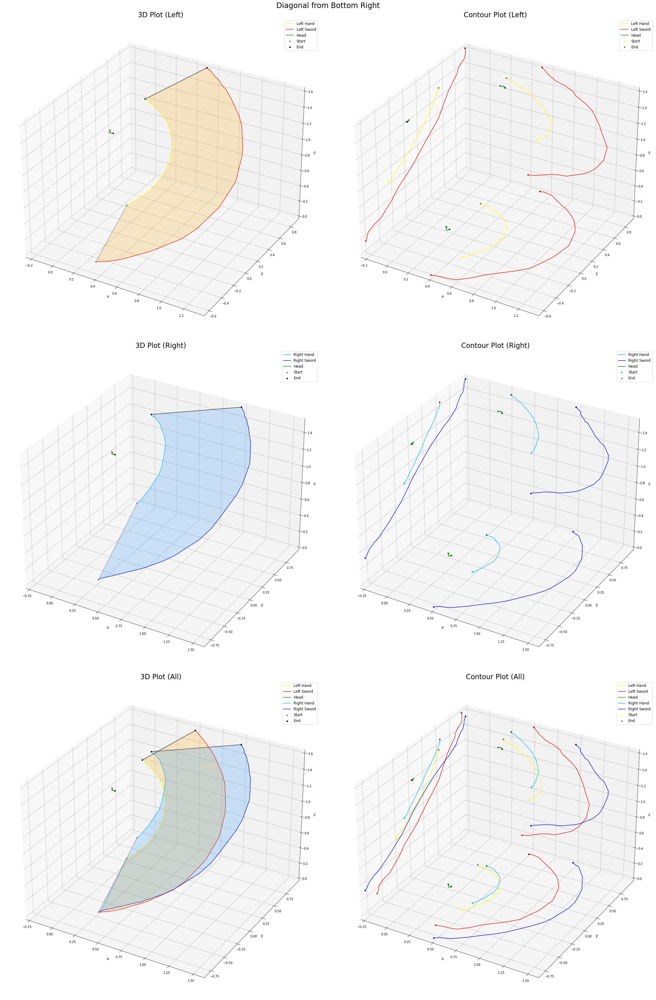

In [44]:
diag_br.plot()

In [138]:
mov = diag_bl.df.copy()
diag_bl.statistics

[('Duration', 0.4, 'seconds'),
 ('Count', 20, 'measurements'),
 ('Total Left Hand Movement', 1.4418, 'meters'),
 ('Total Left Sword Movement', 2.9022, 'meters'),
 ('Total Head Movement', 0.13, 'meters'),
 ('Maximal Left Hand Speed', 8.124, 'm/s'),
 ('Average Left Hand Speed', 3.9628, 'm/s'),
 ('Maximal Left Hand Speed Smoothed', 5.5389, 'm/s'),
 ('Average Left Hand Speed Smoothed', 3.1215, 'm/s'),
 ('Maximal Left Sword Speed Smoothed', 11.7724, 'm/s'),
 ('Average Left Sword Speed Smoothed', 6.2548, 'm/s'),
 ('Maximal Left Sword Speed', 17.0, 'm/s'),
 ('Average Left Sword Speed', 7.8936, 'm/s')]

In [139]:
new_forward = np.array([mov.head_heading_x.mean(), mov.head_heading_y.mean(), 0])
new_forward = new_forward / np.linalg.norm(new_forward)
org_forward = np.array([1, 0, 0])

rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
q1 = qtn.from_float_array(np.array([rot[3], rot[0], rot[1], 0]))

for points_col in ["left_hand", "left_sword", "left", "left_hand_heading",
                   "right_hand", "right_sword", "right", "right_hand_heading",
                   "head", "head_heading"]:
    points_cols = [f"{points_col}_{k}" for k in xyz]
    points = columns_to_points(mov, points_cols)
    rotated_points = Rotation.from_quat(rot).apply(points)
    new_cols = points_to_columns(rotated_points)
    for i in range(3):
        mov[points_cols[i]] = [round(x, 4) for x in new_cols[i]]

for points_col in ["left_hand", "right_hand", "head"]:
    points_cols = [f"{points_col}_q_{k}" for k in "wxyz"]
    points = columns_to_points(mov, points_cols)
    org_qtns = [qtn.from_float_array(np.array(p)) for p in points]
    rotated_quaternions = [qtn.as_float_array(q1 * q2) for q2 in org_qtns]
    new_cols = points_to_columns(rotated_quaternions)
    for i in range(3):  # should technically be range(4) but z SHOULD stay the same. so I leave it the same.
        mov[points_cols[i]] = [round(x, 4) for x in new_cols[i]]

ypr_cols = get_columns(mov, "ypr", "names")
euler_cols = [x for x in get_columns(mov, "euler", "names") if "diff" not in x]
to_drop = ypr_cols + euler_cols
mov.drop(columns=to_drop, inplace=True)

new_diag_bl = Movement(mov, "New Diagonal from Bottom Left", "left")
new_diag_bl.statistics


C:\Users\diana\AppData\Local\Temp\ipykernel_14896\1990424637.py:5: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()


[('Duration', 0.4, 'seconds'),
 ('Count', 20, 'measurements'),
 ('Total Left Hand Movement', 1.4417, 'meters'),
 ('Total Left Sword Movement', 2.9022, 'meters'),
 ('Total Head Movement', 0.1304, 'meters'),
 ('Maximal Left Hand Speed', 8.124, 'm/s'),
 ('Average Left Hand Speed', 3.9628, 'm/s'),
 ('Maximal Left Hand Speed Smoothed', 5.5389, 'm/s'),
 ('Average Left Hand Speed Smoothed', 3.1215, 'm/s'),
 ('Maximal Left Sword Speed Smoothed', 11.7724, 'm/s'),
 ('Average Left Sword Speed Smoothed', 6.2548, 'm/s'),
 ('Maximal Left Sword Speed', 17.0, 'm/s'),
 ('Average Left Sword Speed', 7.8936, 'm/s')]

In [140]:
to_comp = diag_bl.df.drop(columns=to_drop)
to_comp.compare(mov)

left_hand_x        left_hand_y         left_hand_q_x         left_hand_q_y  \
          self  other        self   other          self   other          self   
0          0.2 0.1473        0.46  0.4795         -0.71 -0.7089         -0.52   
1         0.24 0.1893        0.44  0.4641         -0.72 -0.7189         -0.52   
2         0.27 0.2202        0.43  0.4575         -0.73 -0.7289         -0.52   
3         0.34 0.2931         0.4  0.4355         -0.76 -0.7588          -0.5   
4         0.38 0.3351        0.38  0.4201         -0.79 -0.7888         -0.49   
5         0.46 0.4213        0.32  0.3695         -0.84 -0.8387         -0.42   
6          0.5 0.4655        0.28  0.3342         -0.86 -0.8586         -0.38   
7         0.57 0.5474        0.17  0.2327         -0.89 -0.8886         -0.28   
8          0.6 0.5839        0.11  0.1764          -0.9 -0.8986         -0.21   
9         0.61 0.6017        0.04   0.108          -0.9 -0.8986         -0.14   
10         0.6 0.6052       -0.08 -0.0124         -0.86 -0.8586         -0.06   
11        0.59  0.602       -0.14 -0.0731         -0.84 -0.8387         -0.04   
12        0.55 0.5756       -0.26 -0.1968         -0.84 -0.8387          0.08   
13        0.52 0.5503        -0.3 -0.2399         -0.82 -0.8187          0.14   
14        0.47 0.5073       -0.36 -0.3051         -0.77 -0.7688          0.16   
15        0.45 0.4908       -0.39 -0.3372         -0.76 -0.7588          0.16   
16        0.41 0.4555       -0.43 -0.3814         -0.75 -0.7488          0.22   
17        0.39 0.4368       -0.44 -0.3936         -0.73 -0.7289          0.23   
18        0.38 0.4291       -0.46 -0.4146         -0.72 -0.7189          0.23   
19        0.36 0.4103       -0.47 -0.4268         -0.72 -0.7189          0.22   
20        0.35 0.4015       -0.48 -0.4378         -0.72 -0.7189          0.22   

           left_hand_q_w        left_x         left_y         right_hand_x  \
     other          self  other   self   other   self   other         self   
0  -0.5192          0.29 0.2895  -0.36 -0.3947   0.33  0.2876         0.21   
1  -0.5192           0.3 0.2995  -0.32 -0.3583   0.36  0.3219         0.28   
2  -0.5192          0.31 0.3095   -0.3 -0.3418   0.39   0.354         0.32   
3  -0.4992          0.34 0.3395  -0.21  -0.259   0.45  0.4237         0.42   
4  -0.4892          0.34 0.3395  -0.14 -0.1917   0.47  0.4514         0.46   
5  -0.4193          0.34 0.3395   0.02 -0.0361    0.5  0.4991         0.52   
6  -0.3794          0.35 0.3495   0.09  0.0324   0.51  0.5169         0.54   
7  -0.2796          0.35 0.3495   0.29  0.2345   0.48  0.5094         0.56   
8  -0.2097          0.34 0.3395   0.38  0.3306   0.42  0.4599         0.56   
9  -0.1398          0.34 0.3395   0.45  0.4058   0.37   0.418         0.55   
10 -0.0599          0.37 0.3694   0.52  0.4843   0.29  0.3464         0.53   
11 -0.0399          0.36 0.3594   0.55  0.5197   0.24     0.3         0.52   
12  0.0799          0.25 0.2496   0.59  0.5807   0.05  0.1157         0.49   
13  0.1398          0.26 0.2596    0.6  0.5996  -0.03  0.0373         0.48   
14  0.1597          0.31 0.3095   0.59  0.5919  -0.05  0.0163         0.44   
15  0.1597          0.26 0.2596   0.57  0.5743  -0.07 -0.0058         0.43   
16  0.2197          0.18 0.1797   0.54  0.5567  -0.18 -0.1184          0.4   
17  0.2296          0.23 0.2296   0.55  0.5667  -0.18 -0.1173         0.39   
18  0.2296          0.27 0.2696   0.54  0.5545  -0.16 -0.0986         0.39   
19  0.2197          0.23 0.2296   0.54  0.5567  -0.18 -0.1184         0.38   
20  0.2197          0.21 0.2097   0.53  0.5468  -0.18 -0.1196         0.38   

          right_hand_y         right_hand_q_x         right_hand_q_y          \
    other         self   other           self   other           self   other   
0  0.1583         0.45  0.4707          -0.86 -0.8586          -0.25 -0.2496   
1  0.2301         0.43  0.4586          -0.87 -0.8686          -0.28 -0.2796   
2  0.2721         0.41  

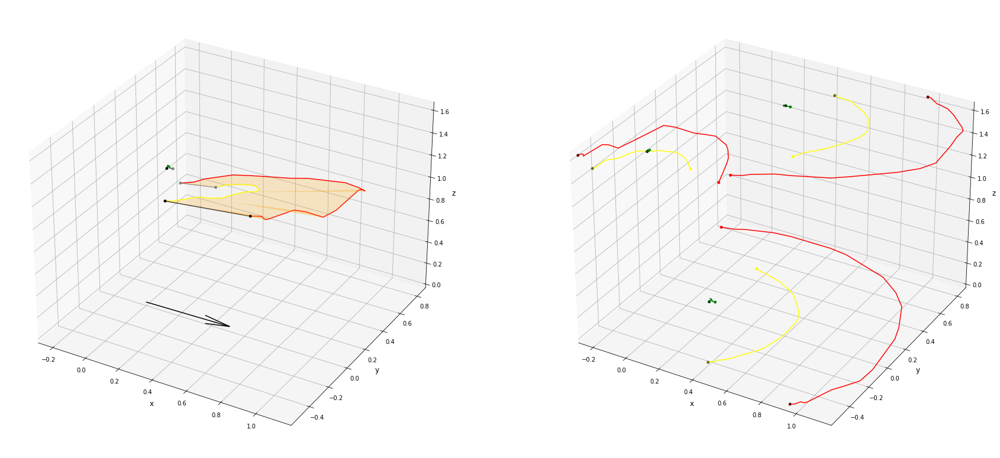

In [111]:
fig = plt.figure(figsize=(30,15))

ax3d = fig.add_subplot(1, 2, 1, projection="3d")
plot_3d(mov, "lh, ls, h", ax3d, left_fill=True, interval_markers=False)
plot_vectors(mov, 0, "h", ax3d, False, True, False, 0.5)

axcon = fig.add_subplot(1, 2, 2, projection="3d")
plot_contour(mov, "lh, ls, h", axcon)

plt.show()

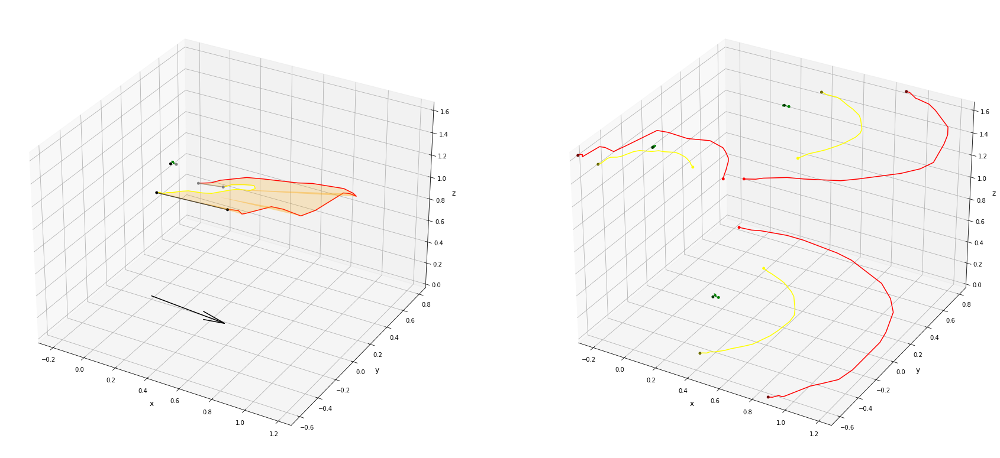

In [109]:
fig = plt.figure(figsize=(30,15))

ax3d = fig.add_subplot(1, 2, 1, projection="3d")
plot_3d(mov, "lh, ls, h", ax3d, left_fill=True, interval_markers=False)
plot_vectors(mov, 0, "h", ax3d, False, True, False, 0.5)

axcon = fig.add_subplot(1, 2, 2, projection="3d")
plot_contour(mov, "lh, ls, h", axcon)

plt.show()

In [ ]:
plot_ve

In [ ]:
paths = get_all_files(".", ".csv", full_path=True)
log_names, log_cols, log_rows = list(), list(), list()
for p in paths:
    df = pd.read_csv(p)
    log_names.append(pl.Path(p).name)
    log_rows.append(df.shape[0])
    log_cols.append(df.shape[1])
    # print(f"{pl.Path(p).name}: {df.shape[0]} rows and {df.shape[1]} columns")
all_logs = list(zip(log_names, log_cols, log_rows))
formats = list(set(log_cols))

overview = {k: dict() for k in formats}

for l in all_logs:
    n, col, r = l
    overview[col][n] = r

current_format = 64  # columns in input csv

for k, v in overview[current_format].items():
    print(f"{k}: {v} rows")

## Identify Movement by Speed

In [245]:
# log_A.columns.to_list()
# log_A = get_log_df("ExampleFiles/log-2023-11-20T043349.csv", 5, 4, True)
log = get_log_df("AllFiles/log-2023-11-23T203435.csv", 5, 4, True)
dir_heading = pd.concat([get_columns(log, "heading"), get_columns(log, "dir")])#.fillna(0)

# dir_heading.count()
# speeds = get_columns(log, "speed").copy()
show_statistics(log, "speed")

# get_movement_by_speed(log, speed_threshold=0.001)

# get_movement_ids(log, angle_threshold=90)

420 points with speed of 0 m/s (34.43%)
436 points with speed of 0 m/s (35.74%)
193 points with speed of 0 m/s (15.82%)
96 points with speed of 0 m/s (7.87%)
points_between: 5 -> time between: 0.10 seconds
206 of 1220 vectors without a direction in left_sword (16.89%)
113 of 1220 vectors without a direction in right_sword (9.26%)
points_between: 5 -> time between: 0.10 seconds
Object with 1220 rows and 91 columns
left_hand_speed Range [0.0 : 6.6083] -> Diff 6.61 m/s
right_hand_speed Range [0.0 : 5.5771] -> Diff 5.58 m/s
left_sword_speed Range [0.0 : 18.0355] -> Diff 18.04 m/s
right_sword_speed Range [0.0 : 23.5351] -> Diff 23.54 m/s


In [40]:
all_results = dict()
# result_cols = list()

for st in [0.1, 0.01, 0.001, 0.0001]:  # st = speed_threshold
    for pb in range(1, 11):  # points_between
        log = get_log_df("AllFiles/2023-11-23/log-2023-11-23T203435.csv", pb)
        get_movement_by_speed(log, speed_threshold=st)
        for b, m, col, t in it.product(["and", "or"], ["avg", "max"], ["sword", "blade"], range(45, 180, 15)):

            res = get_movement_ids(
                df = log,
                results = "dict",
                sections_to_use = ["left"],
                by_col = b,
                method = m,
                diff_column = col,
                angle_threshold = t)["left_movement"]

            col = f"l{col[0]}_{b}_{m}{t}_{int(st*10000)}_{pb}pb"

            res = [1 if x > 0 else x for x in res]
            
            all_results[col] = res.copy()
            # result_cols.append(col)

# all_results = all_results[result_cols]

In [41]:
log = pd.read_csv("AllFiles/2023-11-23/log-2023-11-23_manual_labeling.csv")

correct_movement = log.left_movement.to_list()
correct_movements = [1 if x > 0 else x for x in correct_movement]

del correct_movement

In [260]:
import re

In [43]:
# and_or_cols = [r for r in result_cols if "_and_" in r or "_or_" in r]
# all_res = all_results.to_dict("list")
res_cols, res_lists = list(all_results.keys()), list(all_results.values())

res = pd.DataFrame(all_results)
res.to_csv("AllFiles/2023-11-23/2023-11-23_all_results.csv", index_label="index")

matching_points_list = list()
for i in range(log.shape[0]):
    correct = correct_movements[i]
    matching_points_list.append([l[i] == correct for l in res_lists])

matchings = points_to_columns(matching_points_list)
accuracy_list = [sum(m) / len(m) for m in matchings]

accuracy = pd.DataFrame({"method": res_cols, "accuracy": accuracy_list})
accuracy.sort_values(by="accuracy", ascending=False, inplace=True)

regex = "l([bs])\_([a-z]+)\_([a-z]+)(\d+)\_(\d+)_(\d+)pb"
re_results = list()
for k, v in accuracy.itertuples(index=False):
    el = re.match(regex, k)
    re_results.append(list(el.groups()))
    print(f"{k:>22}: {v * 100:.4f}% accuracy")

regex_results = points_to_columns(re_results)

  lb_and_avg75_100_1pb: 84.3443% accuracy
  lb_and_avg60_100_1pb: 84.3443% accuracy
   lb_and_avg75_10_1pb: 84.3443% accuracy
   lb_and_avg60_10_1pb: 84.3443% accuracy
    lb_and_avg60_1_1pb: 84.3443% accuracy
    lb_and_avg75_1_1pb: 84.3443% accuracy
 lb_and_avg60_1000_1pb: 84.3443% accuracy
 lb_and_avg75_1000_1pb: 84.3443% accuracy
   lb_and_max120_1_1pb: 84.0984% accuracy
lb_and_max135_1000_1pb: 84.0984% accuracy
 lb_and_max120_100_1pb: 84.0984% accuracy
 lb_and_max135_100_1pb: 84.0984% accuracy
lb_and_max105_1000_1pb: 84.0984% accuracy
lb_and_max120_1000_1pb: 84.0984% accuracy
 lb_and_max105_100_1pb: 84.0984% accuracy
   lb_and_max135_1_1pb: 84.0984% accuracy
   lb_and_max105_1_1pb: 84.0984% accuracy
  lb_and_max105_10_1pb: 84.0984% accuracy
  lb_and_max120_10_1pb: 84.0984% accuracy
  lb_and_max135_10_1pb: 84.0984% accuracy
  lb_and_avg75_100_2pb: 82.5410% accuracy
  lb_and_avg60_100_2pb: 82.5410% accuracy
    lb_and_avg60_1_2pb: 82.5410% accuracy
    lb_and_avg75_1_2pb: 82.5410% a

In [44]:
colnames = ["vector", "speed_method", "angle_method", "angle_threshold", "speed_threshold", "points_between"]
values_dict = {k: list(set(v)) for k, v in zip(colnames, regex_results)}

score_dict = {k: dict() for k in values_dict.keys()}

for k, vl in values_dict.items():
    score_dict[k] = {v: 0 for v in vl}

reg_dict = {k: v for k, v in zip(colnames, regex_results)}

for col, val in reg_dict.items():
    for i in range(len(val)):
        score_dict[col][val[i]] += 1 / (i + 1)
    for i in range(20):
        score_dict[col][val[i]] += 1

print(score_dict)

rank_dict = dict()

for col, inner_dict in score_dict.items():
    rank_dict[col] = sorted(list(inner_dict.items()), key = lambda k: k[1], reverse=True)

print(rank_dict)

{'vector': {'b': 26.784415936152016, 's': 1.758518902943684}, 'speed_method': {'or': 0.7698816527651657, 'and': 27.773053186330536}, 'angle_method': {'max': 15.36384388752757, 'avg': 13.179090951568135}, 'angle_threshold': {'90': 0.7836784965317249, '165': 0.22365526661132834, '135': 4.742452707003707, '120': 4.817202836499203, '45': 0.6643330189674564, '105': 4.865519315140396, '75': 6.3673134887528855, '150': 0.22416132766136368, '60': 5.854618381927635}, 'speed_threshold': {'1000': 6.852602285288948, '100': 7.957130721617872, '1': 6.795762385790907, '10': 6.9374394463979625}, 'points_between': {'3': 0.7813316436728914, '10': 0.18016376712253648, '9': 0.19238800254987, '4': 0.44397302596275673, '2': 1.3203671695555619, '8': 0.20806305941209616, '1': 24.531563785270656, '5': 0.3558638014797897, '7': 0.24346023149388757, '6': 0.2857603525756502}}
{'vector': [('b', 26.784415936152016), ('s', 1.758518902943684)], 'speed_method': [('and', 27.773053186330536), ('or', 0.7698816527651657)], 

- **Vector**: `"blade"` gives much better accuracy every single time
- **Speed Method**: The `"or"` speeds, I can at most use in a secondary movement check somewhere. With my current method, _never_. `"and"` all the way.
- **Angle Method**:
  - `"max"` and `"avg"` seem to be neck-to-neck with `max` appearing better in the overall ranking, though `"avg"` takes all the top spots.
  - This, in particular, ought to be checked against at *least* one more labeled dataset.
- **Angle Threshold**:
  - Either `60` or`75` can be good with `"avg"`.
  - Anything from `105`, `120`, or `135` seem to all work pretty well with `"max"`.
  - Both of those should also be compared against at least one more dataset to see if any value stands out in particular.
- **Speed Threshold**:
  - The speed threshold doesn't make a difference at all, it seems. There either is a speed or there isn't.
  - (Most likely, rounding to four decimals already does the filtering this was meant to achieve.)
- **Points Between**
  - The lower the better: `1` point_between gives the best results by far.
  - I assume that doing some kind of smoothing by looking at a wider range of points will be useful in other places, like the visualization, but since the movement identification is mostly binary, it just introduces inaccuracies - After all, choosing more points will make the algorithm "assume" there is still a speed of 0.01m/s where it's actually stopped already, and other things like that.



In [ ]:
all_mids = log.left_movement.to_list()
allr = [[k, c] for k, c in it.groupby(all_mids)]

In [ ]:
results = dict()
for seg in ["left", "right"]:
    allr = [[k, sum(1 for i in g)] for k, g in it.groupby(log[f"{seg}_and"].to_list())]
    res = list()
    for [m, col] in allr:
        start_sword = log.iloc[[len(res) - 1]][[f"{seg}_{k}" for k in xyz]].to_numpy().flatten()
        start_head = log.iloc[[len(res) - 1]][[f"head_{k}" for k in xyz]].to_numpy().flatten()
        stop_sword = log.iloc[[len(res) - 1 + col]][[f"{seg}_{k}" for k in xyz]].to_numpy().flatten()
        stop_head = log.iloc[[len(res) - 1 + col]][[f"head_{k}" for k in xyz]].to_numpy().flatten()
        # for p in [start_sword, start_head, stop_sword, stop_head]:
            # print(p)

        dist_start, dist_stop = np.linalg.norm(start_head - stop_sword), np.linalg.norm(stop_head - stop_sword)
        # print(dist_start, dist_stop, dist_stop < dist_start)
        res.append([dist_start, dist_stop, dist_stop < dist_start])
        # print(res[-1])
    results[seg] = res

In [ ]:
res = results["left"]
ds, de, comp = points_to_columns(res)
allr = [[k, c] for k, c in it.groupby(all_mids)]
mid, counts = points_to_columns(allr)

zipper = list(zip(*list(log[["left_movement", "right_movement"]].to_dict("list").values())))
midl, midr = points_to_columns([list(z) for z in zipper])
complr = [x == y for (x, y) in zipper]
list(zip(complr, *list(log[["left_movement", "right_movement"]].to_dict("list").values())))

In [ ]:
for i in range(len(mid)):
    print(f"{mid[i]}: {comp[i]}")

In [306]:
movement_indexes

,movement,count,start_index,end_index,time
0,0,36,0,36,0.72
1,-1,47,36,83,0.94
2,0,11,83,94,0.22
3,1,23,94,117,0.46
4,0,51,117,168,1.02
5,-1,42,168,210,0.84
6,0,6,210,216,0.12
7,2,23,216,239,0.46
8,0,52,239,291,1.04
9,-1,36,291,327,0.72


Looking at the `time` column of my labeled (aka accurate) dataset, I notice that my cuts are very constant. I take between 0.44 and 0.48 seconds for all but one of them, and that one is still close at 0.54 seconds.

In [220]:
rainbow_colors = [
    ["grey", "grey"],
    ["darkred", "darkred"],
    ["red", "red"],
    ["orange", "orange"],
    ["yellow", "yellow"],
    ["lightgreen", "lightgreen"],
    ["green", "green"],
    ["darkgreen", "darkgreen"],
    ["darkblue", "darkblue"],
    ["blue", "blue"],
    ["lightblue", "lightblue"],
    ["pink", "pink"],
    ["purple", "purple"],
    ["darkgrey", "darkgrey"]]

plot_size = 15

In [ ]:
", ".join(log.columns.to_list())

In [ ]:
for (i, [m, col, s, e, t]) in movement_indexes.iterrows():

    fig = plt.figure(
        figsize=(plot_size * 2, plot_size),
        constrained_layout=True)

    fig.suptitle(f"Movement {m} - Left ({col} Points)", fontsize=plot_size * 1.6)

    ax3d = fig.add_subplot(1, 2, 1, projection="3d")
    ax3d.set_title(
        "3D Plot",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)

    d = 5

    if s > d and e < log.shape[0] - d:
        plot_3d(log, "ls, lh, h", ax3d, left_fill=True,
            start=s-d, stop=s, markers_size=plot_size,
            marker_seconds_interval=0.02,
            colorscheme=["lightgrey", "lightgrey"])

        plot_3d(log, "ls, lh, h", ax3d, left_fill=True,
            start=e, stop=e+d, markers_size=plot_size,
            marker_seconds_interval=0.02,
            colorscheme=["lightgrey", "lightgrey"])

    plot_3d(log, "ls, lh, h", ax3d, left_fill=True,
        start=s, stop=e, markers_size=plot_size,
        colorscheme=rainbow_colors[m])


    axcon = fig.add_subplot(1, 2, 2, projection="3d")
    axcon.set_title(
        "Contour Plot",
        fontdict={"fontsize": plot_size * 1.5}, pad=0)

    if s > d and e < log.shape[0] - d:
        plot_contour(log, "ls, lh, h", axcon,
            start=s-d, stop=s, markers_size=plot_size,
            colorscheme=["lightgrey", "lightgrey"])

        plot_contour(log, "ls, lh, h", axcon,
            start=e, stop=e+d, markers_size=plot_size,
            colorscheme=["lightgrey", "lightgrey"])

    plot_contour(log, "ls, lh, h", axcon,
        start=s, stop=e, markers_size=plot_size,
        colorscheme=rainbow_colors[m])

In [ ]:
movements = {k: sum(1 for i in g) for k, g in it.groupby(log.left_movement.to_list()) if k > 0}
ke = [" " * (max(len(str(k)), len(str(g))) - len(str(k))) + str(k) for [k, g] in all]
gr = [" " * (max(len(str(k)), len(str(g))) - len(str(g))) + str(g) for [k, g] in all]
print(", ".join(ke))
print(", ".join(gr))
movement_indexes = {k: [
    log.left_movement.to_list().index(k),
    log.left_movement.to_list().index(k) + movements[k]] for k in movements.keys()}
# i = log["left_movement"].to_list().index(mov, 0) + movements[mov]

print(movements)
print(movement_indexes)
# log.left_movement.to_list()[:i]

In [ ]:
i = 11
mov = log[log["left_movement"] == i]

# show_full_plot(log, "Split by Speed - First 100", start=19, stop=119)
show_full_plot(mov, f"Split by Speed - Movement {i}")

In [ ]:
s_cols = ["left_and", "right_and", "left_or", "right_or"]

res = dict()
for s in s_cols:
    all = [[k, sum(1 for i in g)] for k, g in it.groupby(log[s].to_list())]
    # all[0][0] = 0
    print(all)
    res[s] = [x[1] for x in all if x[0]]
    print(res[s])
    print("")

# visualize the one-segments

In [ ]:
s = speeds.replace(0, np.nan)
s.describe()

In [ ]:
list(zip(log.left_hand_heading_x.to_list(), log.left_dir_x.to_list()))

In [ ]:
vectors_B = [c for c in log_B.columns.to_list() if not any(
    ["_q_" in c, "euler" in c, "time" in c,
     "yaw" in c, "pitch" in c, "roll" in c])]
sections_B = list({
    c.removesuffix("_x").removesuffix("_y").removesuffix("_z") for c in vectors_B})
sections_B.sort()
fig = plt.figure(figsize=(10, 10))
ax = fig.add_subplot(projection="3d")

point_id = 152
for sect in sections_B:
    ax.quiver(0, 0, 0,  # xyz
        log_B[f"{sect}_x"][point_id],  # u
        log_B[f"{sect}_y"][point_id],  # v
        log_B[f"{sect}_z"][point_id],  # w
        length=0.05,
        label=sect)
# sect = "left_dir"
    # ax.plot3D(
    #     [0, log_B[f"{sect}_x"][point_id]],
    #     [0, log_B[f"{sect}_y"][point_id]],
    #     [0, log_B[f"{sect}_z"][point_id]],
    #     label=sect)
ax.legend()

plt.show()

log_B.iloc[[point_id]]

In [161]:
log.shape

(1220, 97)

## Visualize Vectors

In [ ]:
plot_size = 15
point_range = 40
columns = 2
# rows = 20
rows = point_range
# dist = 20
# point_id = 152
fig = plt.figure(figsize=(plot_size * columns, plot_size * rows))

current = 1160
for point_id in range(current, min(log.shape[0], current + point_range)):
    ax3d = fig.add_subplot(rows, columns, point_id % point_range * 2 + 1, projection="3d")
    ax3d.set_title(f"3D Plot - Point {point_id + 1}")
    axcon = fig.add_subplot(rows, columns, point_id % point_range * 2 + 2, projection="3d")

    plot_3d(log, "lh, ls, h", left_fill=True, ax=ax3d,
        start = point_id,
        stop = min(log.shape[0], point_id + 5),
        marker_seconds_interval=0.02,
        interval_markers=True, markers_size=5)
    plot_contour(log, "lh, ls, h", ax=axcon,
        start = point_id,
        stop = min(log.shape[0], point_id + 5),
        markers_size=5)
    plot_vectors(log, point_id, "l, ld, lb", ax=ax3d, start_at_hand=True, do_contour=False)
    plot_vectors(log, point_id, "l, ld, lb", ax=axcon, start_at_hand=True, do_vector=False)

    lims = get_limits(log, "lh, ls, h", buffer = 0.5)

    for ax in [ax3d, axcon]:
        handles, labels = ax.get_legend_handles_labels()
        by_label = dict(zip(labels, handles))
        ax.legend(by_label.values(), by_label.keys(), fontsize="large")
        ax.set_xlim(lims["x"])
        ax.set_ylim(lims["y"])
        ax.set_zlim(lims["z"])


plt.show()

## Visualization

In [ ]:
plot_size: int = 15
plot_title: str = "Test"
df: pd.DataFrame = get_log_df(
    "./Dateien/2023-11-10_new_format/log-2023-11-10T084103.csv")

show_full_plot(df, plot_size=plot_size, plot_title=plot_title)

## Split log_07_11 into sections for the different movements

In [ ]:
log_07_11 = get_log_df("./Dateien/2023-11-07/log-2023-11-07T064243.csv")

In [ ]:
def custom_round(x, base=5):
    return int(base * round(float(x)/base))

one_second = 50  # points
half_second = 25

euler_df = get_columns(log_07_11, "left_hand_euler").round(0)
length = euler_df.shape[0]
cols = euler_df.columns.to_list()
half_second_differences = {k: [0] * half_second for k in cols}
one_second_differences = {k: [0] * one_second for k in cols}

# for c in euler_df.columns.to_list():
#     euler_df[c] = euler_df[c].apply(lambda x: custom_round(x, base=20))
euler_dict = euler_df.to_dict("list")
# euler_lists = list(euler_df.to_dict("list").values())
for second, diff_dict in zip(
    [half_second, one_second], [half_second_differences, one_second_differences]):
    for col in cols:
        for i in range(length - second):
            euler_list = euler_dict[col]
            diff = euler_list[i + second] - euler_list[i]
            if abs(diff) >= 5:
                if diff > 0:
                    diff_dict[col].append(1)
                else:
                    diff_dict[col].append(-1)
            else:
                diff_dict[col].append(0)

half_sec_changes = [False] * length
one_sec_changes = [False] * length

for diff_dict, changes in zip(
    [half_second_differences, one_second_differences], [half_sec_changes, one_sec_changes]):
    for i in range(1, length):
        for col in cols:
            if diff_dict[col][i-1] != diff_dict[col][i]:
                changes[i] = True

for i in range(0, length, 10):
    if half_sec_changes[i-1] and half_sec_changes[i]:
        half_sec_changes[i-1] = False
        half_sec_changes[i] = False
    if one_sec_changes[i-1] and one_sec_changes[i]:
        one_sec_changes[i-1] = False
        one_sec_changes[i] = False
half_second_differences["changes"] = half_sec_changes
one_second_differences["changes"] = one_sec_changes
# for euler in euler_lists:
#     for i in range(1, length - 1):
#         prev, cur, next = euler[i-1:i+2]
#         if any([prev < cur > next, prev > cur < next]):
#             euler[i] = euler[i - 1]



# points = columns_to_points(euler_df)

In [ ]:
one_sec = pd.DataFrame(one_second_differences)
half_sec = pd.DataFrame(half_second_differences)

In [ ]:
one_sec

In [ ]:
import os

files = os.listdir("Dateien/2023-11-10_new_format")

for file in files:
    print(f"get_log_df(\"./Dateien/2023-11-10_new_format/{file}\")")

In [49]:
plot_size = 15
columns = 2
rows = 20
dist = 50

# swords_rotated = columns_to_points(log_B, ["left_blade_x", "left_blade_y", "left_blade_z"])

fig = plt.figure(figsize=(plot_size * columns, plot_size * rows), constrained_layout=True)
for i in range(0, 1220, 100):
    ax = fig.add_subplot(rows, columns, i // 100 * 2 + 1, projection="3d")
    ax.set_title(f"Point {i}")
    # ax.quiver(*hands[i], *swords_rotated[i], label="Rotated Sword (Direction of Blade)")
    plot_vectors(log, i, "l, ld, lb", ax=ax, start_at_hand=True, do_contour=False)
    # plot_contour(log, "lh, ls", ax=ax, start=i, stop=i+1)
    plot_3d(log, "lh, ls", ax=ax,
        start=max(0, i - dist),
        stop=min(log.shape[0], i + dist),
        left_fill = True,
        marker_seconds_interval=0.2)
    ax.legend()
plt.show()

KeyboardInterrupt: 

## Visualization in Streamlit

In [ ]:
time_diff = get_differences(log_A.adjusted_timestamp.to_list())
print(time_diff)

In [ ]:
import streamlit as st
st.set_page_config(page_title="KenjutsuSensor", layout="wide")

files_dict = get_files_dict("Dateien", ".csv")

log_name = st.selectbox("Select the log file to use", list(files_dict.keys()))
# log_path = files_dict[log_name]
log_df = get_log_df(files_dict[log_name])

f = st.form()
range_to_cover = f.slider("Amount of Points to show at once", 1, log_df.shape[0] / 2)
points_before_and_after = range_to_cover / 2

selected_point = f.number_input(
    "Select a point to display data around",
    min_value=0, max_value=log_df.shape[0])

points_min = max(0, selected_point - points_before_and_after)
points_max = min(log_df.shape[0], selected_point + points_before_and_after)

options = ["3D Plot", "Contour Plot", "DataFrame"]
to_show = st.multiselect("What elements to show", options, options)

submitted = f.form_submit_button("Display")

if submitted:


In [ ]:
import pathlib as pl

files = [p.name for p in pl.Path("./Recherche/").rglob("*")]
for file in files:
    print(file.rstrip(".pdf"))

In [ ]:
log_B

# Visualization Re-Do

- **Views / Planes** - names used for axis combinations
  - `t` top view: xy plane
  - `s` side view: xz plane
  - `b` back view: yz plane
  - `f` full view: xyz plane
- **Points** - everything available as 3D points
  - `lh` left hand
  - `ls` left sword
  - `rh` right hand
  - `rs` right sword
  - `h` head
- **Fills** - don't need to be calculated, simply uses coordinates of left/right hand and sword
  - `lf` left fill: area between left hand and sword lines
  - `rf` right fill: area between right hand and sword lines
- **Vectors** - available as 3D points representing the vector from the origin
  - `lsv` left sword vector: left sword position
  - `ldv` left dir vector: left sword direction
  - `lbv` left blade vector: right sword position
  - `rsv` right sword vector: right sword direction
  - `rdv` right dir vector: left blade direction
  - `rbv` right blade vector: right blade direction
  - `hv` head heading vector: headset facing direction
- **data to be transformed/calculated**
  - midpoint between hand and sword as adjusted start point of blade vector
  - connectors: a collection of hand and sword points at the same time, paired - will technically be up to hundreds of separate lines
  - trendline: a linear or polynomial line representing the data, in 2D or 3D

To begin, I have a dataframe, with most of the above data in it but split into multiple columns.

## Helper Functions

In [2]:
visual_elements = [ # acronym, section name, label / long name, color
    ["lh",  "left_hand",    "Left Hand Position",     "orange"],
    ["ls",  "left_sword",   "Left Sword Position",    "red"],
    ["rh",  "right_hand",   "Right Hand Position",    "deepskyblue"],
    ["rs",  "right_sword",  "Right Sword Position",   "blue"],
    ["h",   "head",         "Head Set Position",      "green"],
    ["lsv", "left",         "Left Sword Vector",      "red"],
    ["ldv", "left_dir",     "Left Movement Heading",  "grey"],
    ["lbv", "left_blade",   "Left Blade Heading",     "darkred"],
    ["rsv", "right",        "Right Sword Vector",     "blue"],
    ["rdv", "right_dir",    "Right Movement Heading", "grey"],
    ["rbv", "right_blade",  "Right Blade Heading",    "darkblue"],
    ["hv",  "head_heading", "Head Set Heading",       "darkgreen"]]

visual_acronyms, visual_cols, visual_labels, visual_colors = (
    list(z) for z in zip(*visual_elements))
visual_valid_elements = visual_acronyms + visual_cols

visual_matching = {a: [s, l, c] for [a, s, l, c] in visual_elements}
visual_matching.update({s: [s, l, c] for [a, s, l, c] in visual_elements})

In [ ]:
def validate_elements(elements_to_use: list | str):
    """
    This function takes the input and turns it into a valid `list` of elements to plot, i.e.,
    it converts from comma-separated string to list(), replaces any used shortcuts with the long name,
    and compares all the elements against a list of valid inputs and throws an error if one is not included.
    """

    if isinstance(elements_to_use, str):
        elements_to_use = text_to_list(elements_to_use)

    # check if it is valid (if the element is either a code or a column)
    for e in elements_to_use:
        if e not in visual_valid_elements:
            # print_red(f"{e} is not a valid input and was skipped")
            raise ValueError(f"{e} is not a valid input")

    # convert any codes to columns
    acr_col_matching = {k: v for k, v in zip(visual_acronyms, visual_cols)}
    for i in range(len(elements_to_use)):
        if elements_to_use[i] in visual_acronyms:
            elements_to_use[i] = acr_col_matching[elements_to_use[i]]

    return elements_to_use

In [ ]:
def get_limits(
        df: pd.DataFrame,
        include_vectors: bool = False,
        sections_to_use: list | str = sections):

    buffer = 1 if include_vectors else 0

    xmin, xmax, ymin, ymax, zmin, zmax = [0] * 6
    # xymin, xymax, zmin, zmax = [0] * 4

    for s in get_elements_to_plot(sections_to_use):
        xmin = min(xmin, df[f"{s}_x"].min())
        xmax = max(xmax, df[f"{s}_x"].max())
        ymin = min(ymin, df[f"{s}_y"].min())
        ymax = max(ymax, df[f"{s}_y"].max())
        zmin = min(zmin, df[f"{s}_z"].min())
        zmax = max(zmax, df[f"{s}_z"].max())

    # This section ensures that the x and y axes are of the same scale and centers the elements.
    xdiff, ydiff = xmax - xmin, ymax - ymin
    if xdiff > ydiff:
        xydiff = (xdiff - ydiff) / 2.0
        ymin -= xydiff 
        ymax += xydiff
    if ydiff > xdiff:
        xydiff = (ydiff - xdiff) / 2.0
        xmin -= xydiff
        xmax += xydiff

    return {
        "x": [xmin - buffer, xmax + buffer],
        "y": [ymin - buffer, ymax + buffer],
        "z": [zmin - buffer, zmax + buffer]}

## Data Retrieval Methods

In [64]:
def get_data(
        df: pd.DataFrame,
        section_name: str,
        start: int = 0,
        stop: int = 0):
    """
    retrieve "base" data from the dataframe, potentially with a range

    for example, with section_name = "left_hand", this returns [[left_hand_x], [left_hand_y], [left_hand_z]]
    """

    col = visual_acronyms[section_name] if section_name in visual_acronyms else section_name
    if stop == 0:
        stop = df.shape[0]

    x, y, z = [df[c].to_list()[start:stop] for c in [f"{col}_{k}" for k in "xyz"]]

    return x, y, z


In [ ]:
def get_trendline(
        x: list, y: list, pol: int = 1):
    z = np.polyfit(x, y, pol)
    p = np.poly1d(z)

    res = p(x)

    return x, res

## Plotting Methods

In [ ]:
def draw_contour(
        ax: plt.Axes,
        data: list,
        legend_label: str,
        color: str):

    x, y, z = data
    length = len(data[0])
    xlim = ax.get_xlim()[0]
    ylim = ax.get_ylim()[1]
    zlim = ax.get_zlim()[0]

    # three graphs for one element, so only add one label
    ax.plot3D([xlim] * length, y, z, color, label=legend_label)
    ax.plot3D(x, [ylim] * length, z, color)
    ax.plot3D(x, y, [zlim] * length, color)

    start_points = list()
    end_points = list()

    start_points.append([xlim, y[0], z[0]])
    start_points.append([x[0], ylim, z[0]])
    start_points.append([x[0], y[0], zlim])

    end_points.append([xlim, y[-1], z[-1]])
    end_points.append([x[-1], ylim, z[-1]])
    end_points.append([x[-1], y[-1], zlim])

    return start_points, end_points

In [ ]:
def draw_3d(
        ax: plt.Axes,
        data: list,
        legend_label: str,
        color: str):
    
    x, y, z = data

    ax.plot3D(x, y, z, color, label=legend_label)

    start_point = [[k[0] for k in data]]
    end_point = [[k[-1] for k in data]]

    return start_point, end_point

In [ ]:
def draw_start_and_end(
        ax: plt.Axes,
        data: list,
        add_label: bool = False):
    
    if len(data) > 3:  # it's a line

# Experimenting - Diagonals

In [42]:
log = get_log_df("AllFiles/log-2024-01-11T151245_diagonals.csv", 1, do_prints=True)
get_movement_by_speed(log)
get_movement_ids(log, do_prints=True)

left_hand: 1168 points with speed of 0 m/s (46.68%)
left_hand: 773 points with smoothed speed of 0 m/s (30.90%)
right_hand: 1119 points with speed of 0 m/s (44.72%)
right_hand: 755 points with smoothed speed of 0 m/s (30.18%)
left_sword: 747 points with speed of 0 m/s (29.86%)
left_sword: 386 points with smoothed speed of 0 m/s (15.43%)
right_sword: 457 points with speed of 0 m/s (18.27%)
right_sword: 202 points with smoothed speed of 0 m/s (8.07%)
points_between: 1 -> time between: 0.02 seconds
865 of 2502 vectors without a direction in left_sword (34.57%)
578 of 2502 vectors without a direction in right_sword (23.10%)
found 10 movements in left
found 7 movements in right


,timestamp,adjusted_timestamp,left_hand_x,left_hand_y,left_hand_z,left_hand_speed,left_hand_speed_smoothed,left_hand_q_x,left_hand_q_y,left_hand_q_z,left_hand_q_w,left_hand_euler_x,left_hand_euler_y,left_hand_euler_z,left_x,left_y,left_z,left_blade_euler_diff,left_sword_euler_diff,left_hand_yaw,left_hand_pitch,left_hand_roll,right_hand_x,right_hand_y,right_hand_z,right_hand_speed,right_hand_speed_smoothed,right_hand_q_x,right_hand_q_y,right_hand_q_z,right_hand_q_w,right_hand_euler_x,right_hand_euler_y,right_hand_euler_z,right_x,right_y,right_z,right_blade_euler_diff,right_sword_euler_diff,right_hand_yaw,right_hand_pitch,right_hand_roll,left_sword_x,left_sword_y,left_sword_z,left_dir_x,left_dir_y,left_dir_z,left_sword_speed,left_sword_speed_smoothed,...,right_sword_y,right_sword_z,right_dir_x,right_dir_y,right_dir_z,right_sword_speed,right_sword_speed_smoothed,head_x,head_y,head_z,head_q_x,head_q_y,head_q_z,head_q_w,head_euler_x,head_euler_y,head_euler_z,head_yaw,head_pitch,head_roll,left_hand_local_euler_x,left_hand_local_euler_y,left_hand_local_euler_z,right_hand_local_euler_x,right_hand_local_euler_y,right_hand_local_euler_z,head_local_euler_x,head_local_euler_y,head_local_euler_z,left_hand_heading_x,left_hand_heading_y,left_hand_heading_z,right_hand_heading_x,right_hand_heading_y,right_hand_heading_z,head_heading_x,head_heading_y,head_heading_z,left_blade_x,left_blade_y,left_blade_z,right_blade_x,right_blade_y,right_blade_z,left_and,left_or,right_and,right_or,left_movement,right_movement
0,1704982315015,0.0,0.4,-0.12,1.12,0.0,0.0,0.04,0.12,0.06,0.99,5.2,13.5,7.1,0.45,0.02,0.4,93.4362,86.7136,5.1,13.56,5.88,0.37,0.12,1.1,0.0,0.0,0.05,-0.14,0.01,-0.99,353.8,15.8,358.0,0.66,0.05,0.54,0.0,0.0,-5.96,15.93,-0.34,0.85,-0.1,1.52,0.0,-1.0,0.0,0.0476,0.1522,...,0.17,1.64,0.0,0.0,0.0,0.0,0.0,-0.04,-0.02,1.55,-0.0,0.01,-0.01,1.0,359.7,0.8,358.4,-0.34,0.81,-1.58,5.2,13.5,7.1,353.8,15.8,358.0,359.7,0.8,358.4,0.96,0.12,-0.23,0.96,-0.03,-0.27,1.0,-0.03,-0.01,-0.24,0.06,-0.97,-0.28,-0.1,-0.96,0,0,0,0,0,0
1,1704982315223,0.21,0.4,-0.12,1.12,0.0,0.0,0.04,0.12,0.06,0.99,5.5,13.5,7.3,0.45,0.01,0.4,48.3668,119.1221,5.39,13.51,6.04,0.37,0.12,1.1,0.0,0.0,0.05,-0.14,0.01,-0.99,353.8,15.8,357.9,0.66,0.05,0.54,0.0,0.0,-5.99,15.94,-0.38,0.85,-0.11,1.52,0.4082,-0.4082,-0.8165,1.2247,0.1475,...,0.17,1.64,0.0,0.0,0.0,0.0,0.0333,-0.04,-0.02,1.55,-0.0,0.01,-0.01,1.0,359.7,0.8,358.4,-0.33,0.81,-1.58,5.5,13.5,7.3,353.8,15.8,357.9,359.7,0.8,358.4,0.96,0.12,-0.23,0.96,-0.04,-0.27,1.0,-0.03,-0.01,-0.24,0.07,-0.97,-0.28,-0.1,-0.96,0,0,0,0,0,0
2,1704982315243,0.23,0.4,-0.12,1.11,0.0,0.0,0.05,0.13,0.05,0.99,6.5,14.2,7.0,0.46,0.0,0.39,85.4013,93.9701,6.32,14.32,5.39,0.37,0.12,1.09,0.0,0.0,0.05,-0.14,0.01,-0.99,353.7,16.1,358.0,0.67,0.05,0.54,0.0,0.0,-6.02,16.23,-0.29,0.86,-0.12,1.5,0.0,1.0,0.0,0.25,0.025,...,0.17,1.63,0.0,0.0,0.0,0.0,0.0833,-0.04,-0.02,1.55,-0.0,0.01,-0.01,1.0,359.7,0.9,358.4,-0.29,0.88,-1.63,6.5,14.2,7.0,353.7,16.1,358.0,359.7,0.9,358.4,0.96,0.12,-0.25,0.96,-0.03,-0.28,1.0,-0.03,-0.02,-0.26,0.08,-0.96,-0.28,-0.1,-0.96,0,0,0,0,0,0
3,1704982315282,0.27,0.4,-0.12,1.11,0.0,0.0,0.04,0.13,0.05,0.99,6.1,14.2,7.0,0.46,0.01,0.39,0.0,0.0,5.91,14.23,5.53,0.37,0.12,1.09,0.0,0.0,0.05,-0.14,0.01,-0.99,353.5,16.2,357.7,0.67,0.05,0.54,0.0,0.0,-6.22,16.31,-0.48,0.86,-0.11,1.5,0.0,0.0,0.0,0.0,0.0,...,0.17,1.63,0.0,0.0,0.0,0.0,0.0833,-0.04,-0.02,1.55,-0.0,0.01,-0.01,1.0,359.7,0.9,358.4,-0.34,0.93,-1.55,6.1,14.2,7.0,353.5,16.2,357.7,359.7,0.9,358.4,0.96,0.12,-0.24,0.96,-0.04,-0.28,1.0,-0.03,-0.02,-0.25,0.08,-0.96,-0.28,-0.1,-0.95,0,0,0,0,0,0
4,1704982315300,0.28,0.4,-0.12,1.11,0.0,0.0,0.05,0.13,0.05,0.99,6.2,14.2,7.1,0.46,0.01,0.39,0.0,0.0,6.01,14.27,5.54,0.37,0.12,1.09,0.0,0.0,0.05,-0.14,0.01,-0.99,353.6,16.2,357.7,0.67,0.05,0.54,0.0,0.0,-6.16,16.27,-0.55,0.86,-0.11,1.5,0.0,0.0,0.0,0.0,0.0,...,0.17,1.63,0.0,0.0,0.0,0.0,0.0833,-0.04,-0.02,1.55,-0.0,0.01,-0.01,1.0,359.7,1.0,358.4,-0.3,0.98,-1.55,6.2,14.2,7.1,353.6,16.2,357.7,359.7,1.0,358.4,0.96,0.12,-0.24,0.96,-0.04,

In [62]:
# movs = log.query("left_movement > 0 or right_movement > 0")

# for (l, r) in list(zip(*log[["left_movement", "right_movement"]].to_dict("list").values())):
#     if l == r and (l == 0 or l == -1):
#         continue
#     elif l == 

midx_l = get_movement_indexes(log)
midx_r = get_movement_indexes(log, side="right")

mov1 = Movement(log, f"Mov 1", "left", mid=1)
mov2 = Movement(log, f"Mov 2", "left", mid=2)
mov3 = Movement(log, f"Mov 3", "left", mid=3)
mov4 = Movement(log, f"Mov 4", "left", mid=4)
mov5 = Movement(log, f"Mov 5", "left", mid=5)
mov6 = Movement(log, f"Mov 6", "left", mid=6)
mov7 = Movement(log, f"Mov 7", "left", mid=7)
mov8 = Movement(log, f"Mov 8", "left", mid=8)
mov9 = Movement(log, f"Mov 9", "left", mid=9)

movs = [mov1, mov2, mov3, mov4, mov5, mov6, mov7, mov8, mov9]

mov1.df

C:\Users\diana\AppData\Local\Temp\ipykernel_18564\2397543570.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_18564\2397543570.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_18564\2397543570.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_18564\2397543570.py:71: UserWarning: Optimal rotation is not uniquely or poorly defined for the given sets of vectors.
  rot = Rotation.align_vectors([org_forward], [new_forward])[0].as_quat()
C:\Users\diana\AppData\Local\Temp\ipykernel_18564\23

,timestamp,adjusted_timestamp,left_hand_x,left_hand_y,left_hand_z,left_hand_distances,left_hand_speed,left_hand_speed_smoothed,left_hand_q_x,left_hand_q_y,left_hand_q_z,left_hand_q_w,left_x,left_y,left_z,left_blade_euler_diff,left_sword_euler_diff,right_hand_x,right_hand_y,right_hand_z,right_hand_speed,right_hand_speed_smoothed,right_hand_q_x,right_hand_q_y,right_hand_q_z,right_hand_q_w,right_x,right_y,right_z,right_blade_euler_diff,right_sword_euler_diff,left_sword_x,left_sword_y,left_sword_z,left_sword_distances,left_dir_x,left_dir_y,left_dir_z,left_sword_speed,left_sword_speed_smoothed,right_sword_x,right_sword_y,right_sword_z,right_dir_x,right_dir_y,right_dir_z,right_sword_speed,right_sword_speed_smoothed,head_x,head_y,head_z,head_distances,head_q_x,head_q_y,head_q_z,head_q_w,left_hand_heading_x,left_hand_heading_y,left_hand_heading_z,right_hand_heading_x,right_hand_heading_y,right_hand_heading_z,head_heading_x,head_heading_y,head_heading_z,left_blade_x,left_blade_y,left_blade_z,right_blade_x,right_blade_y,right_blade_z,left_and,left_or,right_and,right_or,left_movement,right_movement
0,1704982322557,7.54,-0.1625,-0.3878,1.62,0.0173,0.5774,2.3263,0.03,-0.9298,-0.22,0.2799,-0.5653,0.1043,-0.18,42.3059,52.081,-0.1486,0.4036,1.63,0.3333,2.9756,0.13,0.9498,-0.07,-0.2799,-0.7833,0.0543,-0.34,56.0972,56.1279,-0.7278,-0.2835,1.44,0.036,0.0,-0.8321,0.5547,1.2019,6.2251,-0.9319,0.458,1.29,0.169,0.8452,0.5071,1.972,9.4591,-0.0091,-0.0204,1.55,0.01,-0.01,0.02,-0.02,0.9997,-0.8309,-0.2181,0.52,-0.8219,0.2428,0.52,1.0008,0.0056,-0.04,0.55,-0.4,0.74,0.55,0.05,0.83,1,1,1,1,1,1
1,1704982322585,7.57,-0.152,-0.3973,1.63,0.0099,1.0,2.9685,0.05,-0.9198,-0.22,0.3099,-0.5744,0.0839,-0.17,45.087,51.0996,-0.1386,0.4041,1.63,2.0,3.7547,0.15,0.9398,-0.06,-0.2999,-0.7856,0.1043,-0.31,52.5998,57.5762,-0.7265,-0.3134,1.46,0.0361,0.0,-0.8321,0.5547,3.6056,8.1099,-0.9241,0.5084,1.32,0.2673,0.8018,0.5345,3.7417,12.2452,-0.0095,-0.0104,1.55,0.0,-0.01,0.02,-0.02,0.9997,-0.7887,-0.2662,0.55,-0.7933,0.2741,0.54,1.0008,0.0056,-0.04,0.59,-0.37,0.72,0.57,0.02,0.82,1,1,1,1,1,1
2,1704982322598,7.58,-0.1421,-0.3969,1.63,0.0246,0.8165,3.3618,0.07,-0.9198,-0.21,0.3199,-0.583,0.0535,-0.15,48.1383,63.0014,-0.1186,0.405,1.63,0.8165,4.1556,0.16,0.9398,-0.05,-0.3099,-0.7969,0.1338,-0.29,50.8419,50.2292,-0.7251,-0.3434,1.48,0.0768,0.1302,-0.9113,0.3906,2.5604,8.948,-0.9155,0.5388,1.34,0.212,0.742,0.636,3.1447,13.8447,-0.0095,-0.0104,1.55,0.0,-0.01,0.02,-0.02,0.9997,-0.7673,-0.2953,0.57,-0.7743,0.295,0.56,1.0008,0.0056,-0.04,0.62,-0.34,0.7,0.59,-0.01,0.81,1,1,1,1,1,1
3,1704982322626,7.61,-0.1216,-0.406,1.64,0.0141,1.4142,4.0351,0.1,-0.9098,-0.19,0.3599,-0.5903,-0.0069,-0.13,46.6708,61.0897,-0.0991,0.4159,1.64,2.2361,4.9572,0.19,0.9198,-0.04,-0.3399,-0.7997,0.1937,-0.24,42.222,60.4796,-0.7119,-0.4129,1.51,0.0458,0.2182,-0.8729,0.4364,4.5826,10.4836,-0.8987,0.6097,1.4,0.4685,0.6247,0.6247,6.4031,16.3816,-0.0095,-0.0104,1.55,0.0,-0.02,0.02,-0.02,0.9997,-0.7042,-0.3625,0.6,-0.7066,0.3481,0.61,1.0008,0.0056,-0.03,0.69,-0.28,0.67,0.64,-0.06,0.76,1,1,1,1,1,1
4,1704982322640,7.62,-0.1112,-0.4155,1.64,0.0246,1.2247,4.2139,0.13,-0.8998,-0.19,0.3699,-0.5889,-0.0369,-0.11,41.8282,60.7346,-0.0795,0.4268,1.64,1.5811,5.1666,0.2099,0.9098,-0.04,-0.3599,-0.791,0.2242,-0.2,49.8825,58.3747,-0.7001,-0.4524,1.53,0.0616,0.3244,-0.8111,0.4867,3.0822,11.0013,-0.8706,0.651,1.44,0.4243,0.7071,0.5657,3.5355,17.2127,-0.0095,-0.0104,1.55,0.0,-0.02,0.02,-0.02,0.9997,-0.6724,-0.4011,0.62,-0.6685,0.3899,0.64,1.0008,0.0056,-0.04,0.72,-0.24,0.65,0.68,-0.08,0.73,1,1,1,1,1,1
5,1704982322654,7.64,-0.0907,-0.4246,1.65,0.0616,2.0548,4.6289,0.16,-0.8898,-0.18,0.3999,-0.5871,-0.0768,-0.09,39.8009,64.9958,-0.0496,0.4282,1.65,2.357,5.5722,0.2399,0.8898,-0.04,-0.3799,-0.7933,0.2741,-0.17,46.432,63.0011,-0.6778,-0.5014,1.56,0.1556,0.45,-0.7714,0.45,5.1854,12.1635,-0.8429,0.7023,1.48,0.5455,0.6364,0.5455,7.3333,18.3576,-0.0095,-0.0104,1.55,0.0,-0.02,0.02,-0.02,0.9997,-0.6197,-0.4587,0.64,-0.6104,0.4326,0.67,1.0008,0.00

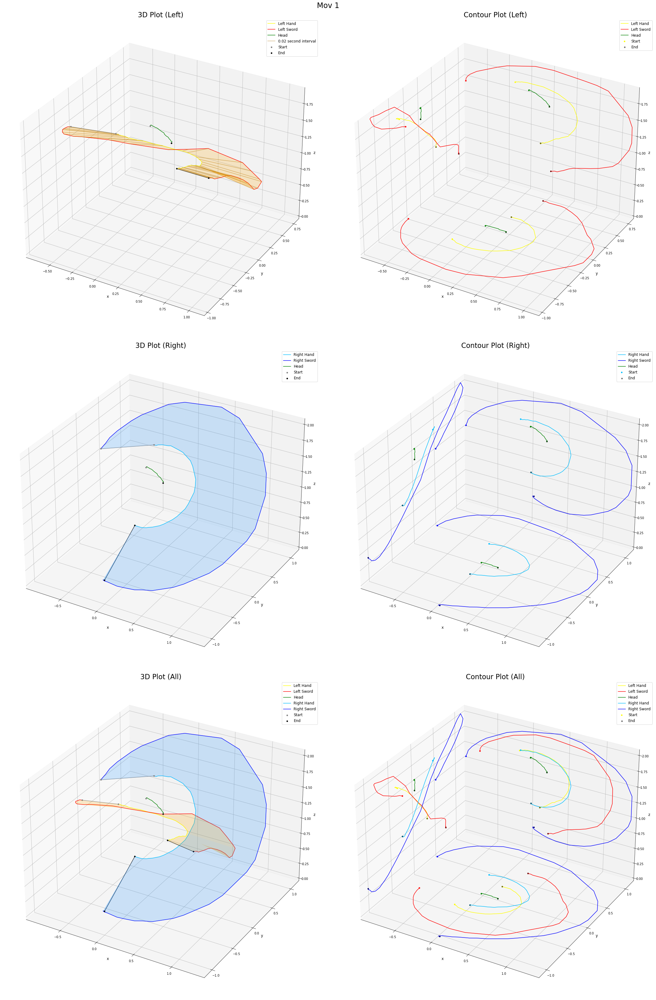

In [61]:
mov1.plot()

Left Hand
[[7.70879297e-04 6.62908015e-05]
 [6.62908015e-05 6.87852725e-05]]

Left Sword
[[9.50195534e-04 3.77435482e-05]
 [3.77435482e-05 3.11357888e-04]]

Right Hand
[[ 3.70277736e-04 -1.95576072e-05]
 [-1.95576072e-05  3.59868423e-05]]

Right Sword
[[8.95984785e-04 5.56070557e-05]
 [5.56070557e-05 5.97750739e-04]]

Left Hand
[[2.55649396e-04 5.39916916e-05]
 [5.39916916e-05 3.25229331e-05]]

Left Sword
[[0.00087444 0.00032644]
 [0.00032644 0.00035625]]

Right Hand
[[ 4.45567985e-04 -8.06618088e-05]
 [-8.06618088e-05  5.61669086e-05]]

Right Sword
[[ 0.00270191 -0.00088926]
 [-0.00088926  0.00126067]]

Left Hand
[[ 3.58133096e-04 -2.22096240e-05]
 [-2.22096240e-05  7.42901916e-05]]

Left Sword
[[ 0.00151454 -0.000185  ]
 [-0.000185    0.00087632]]

Right Hand
[[ 0.0133804  -0.00534293]
 [-0.00534293  0.00215112]]

Right Sword
[[ 0.00094647 -0.00080221]
 [-0.00080221  0.00076502]]

Left Hand
[[0.00899801 0.00428395]
 [0.00428395 0.00204083]]

Left Sword
[[0.05638504 0.04861467]
 [0.04

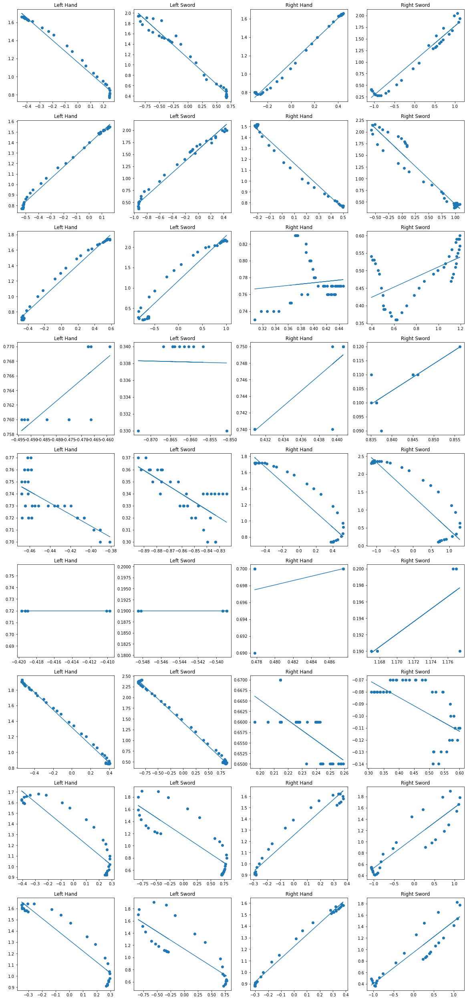

In [70]:
yzs = mov2.df[["left_hand_y", "left_hand_z", "left_sword_y", "left_sword_z", "right_hand_y", "right_hand_z", "right_sword_y", "right_sword_z"]].to_dict("list")
plot_size = 5
columns = 4
rows = 9
i = 0

fig = plt.figure(figsize=(plot_size * columns, plot_size * rows))

cols = ["left_hand", "left_sword", "right_hand", "right_sword"]

for m in movs:
    for col in cols:
        i += 1

        y, z = m.df[[f"{col}_y", f"{col}_z"]].to_dict("list").values()
        k = np.polyfit(y, z, 1)
        p = np.poly1d(k)

        t = to_text(col)
        ax = fig.add_subplot(rows, columns, i, )
        ax.set_title(t)

        ax.scatter(y, z)
        ax.plot(y, p(y))
    
        print(t)
        # print(y)
        # print(p(y))
        print(np.polyfit(y, z, 1, cov=True)[1])
        print()

# plt.scatter(lhy, lhz)
# plt.plot(lhy, lhp(lhy))


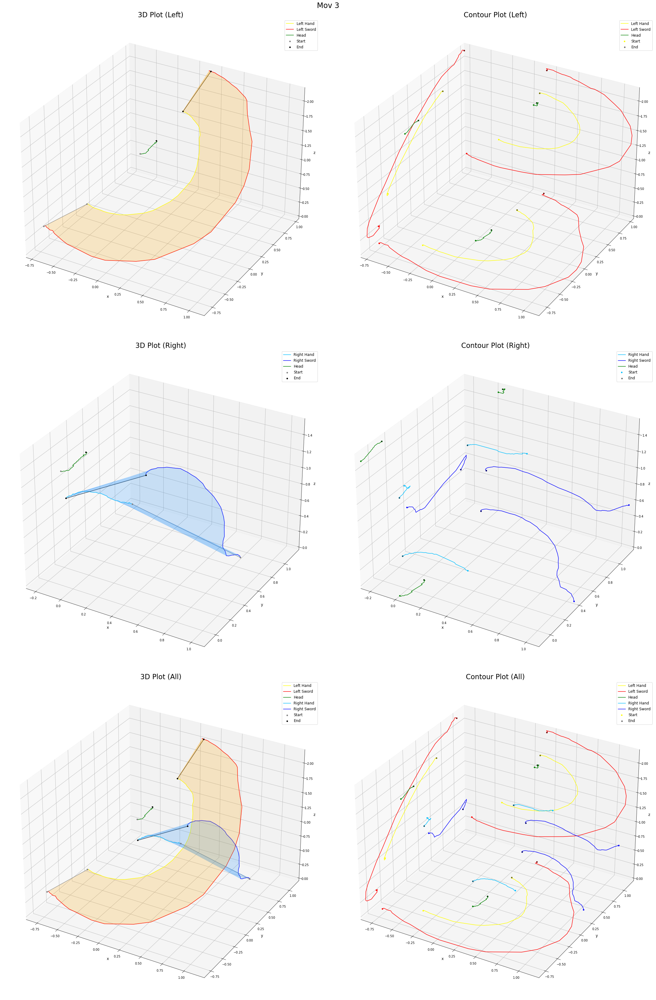

In [56]:
mov3.plot()

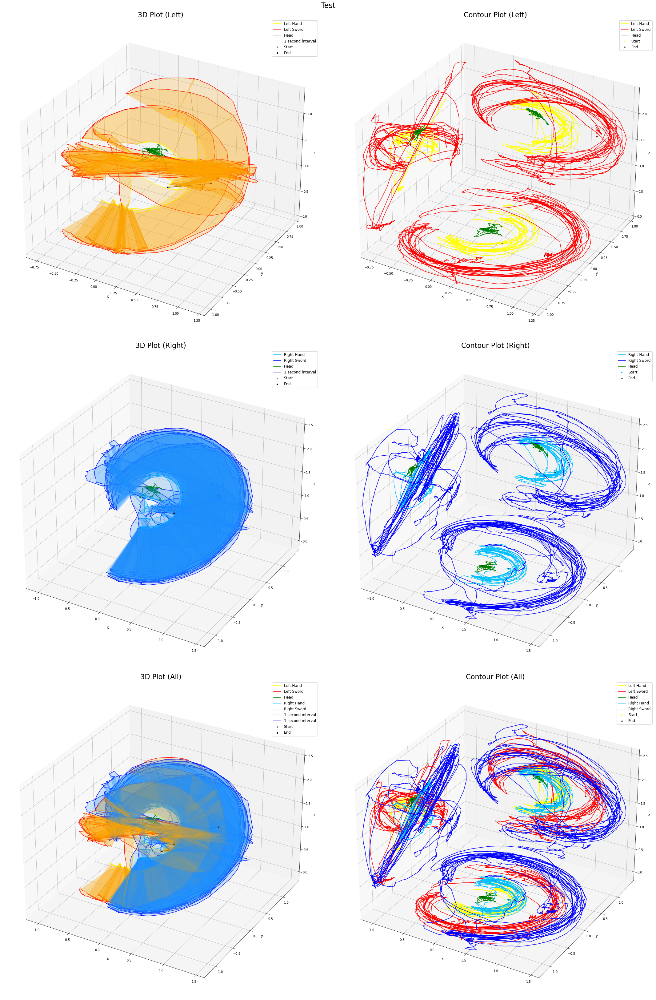

In [42]:
show_full_plot(log)

# 5 Documentation

## 4.1 DataFrame Columns - What I Have

| Column Name                 | Description                                                                         | rounded to |                   
| :-------------------------- | :-----------------------------------------------------------------------------------| :--------- |            
| `timestamp`                 | timestamp in milliseconds since UTC Epoch (+0)                                      | \-         |                   
| `adjusted_timestamp`        | timestamp in seconds since time of first measurement                                | 2          | 
| `left/right_hand_xyz`       | xyz coordinates of left/right hand (controller)                                     | 2          | 
| `left/right_dir_xyz`        | normalized vector representing the movement direction - from origin to xyz          | 4          | 
| `left/right_hand_q_xyzw`    | values representing the quaternion                                                  | 2          |           
| `left/right_hand_euler_xyz` | euler representation of quaternion - rotation around xyz axes                       | 2          | 
| `left/right_xyz`            | normalized vector representing the left sword - from origin to xyz                  | 2          | 
| `left/right_hand_yaw`       | yaw angles calculated within Unity: around z axis - orientation compared to forward | 2          |                                                  
| `left/right_hand_pitch`     | pitch angles calculated within Unity: around y axis - pointing upwards or downwards | 2          |                                                  
| `left/right_hand_roll`      | roll angles calculated within Unity: around x axis - rotation around self           | 2          |                                       
| `left/right_sword_xyz`      | xyz coordinates of the sword tips                                                   | 2          | 
| `head_xyz`                  | xyz coordinates of the head(set)                                                    | 2          | 
| `head_q_xyzw`               | values representing the quaternion                                                  | 2          | 
| `head_euler_xyz`            | euler representation of quaternion - rotation around xyz axes                       | 2          | 
| `head_yaw`                  | yaw angles calculated within Unity: around z axis - orientation compared to forward | 2          |                                                    
| `head_pitch`                | pitch angles calculated within Unity: around y axis - pointing upwards or downwards | 2          |                                                  
| `head_roll`                 | roll angles calculated within Unity: around x axis - rotation around self           | 2          |                                                    

## What I Need

- xyz coordinates of hands, swords, and head :white_check_mark: `left_hand_xyz`, `right_hand_xyz`, `head_xyz`, `left_sword_xyz`, `right_sword_xyz`
- rotation of hands around self :question: (_might_ be given in `_hand_roll`)
- current forward direction -> `head_euler_z` to normalized vector? :x:
- angular difference between direction the **sharpened blade** is pointing and movement direction :x:
- difference between the sword vector and the direction vector xyz! :x: